In [73]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [2]:
# Importamos base de datos
data=pd.read_parquet('24o_medicom_con_materiales.parquet')
data.rename(columns={'material':'id_material'}, inplace=True)
data

,fecha,id_material,id_cliente,ventas
0,2022-08-12,SOLUCION DX-10 C/1000ML FLX SI,513,-63.600000000
1,2021-02-06,IRRIGATEK 2 VIA P/BOLSA,513,195.700000000
2,2021-01-07,INOTROPISA 200MG/5ML C/5ML 5AMP SI,513,212.540000000
3,2023-07-27,BICARNAT 7.5% C/50ML 1FAMP SI,513,333.600000000
4,2023-03-14,BICARNAT 7.5% C/50ML 1FAMP SI,513,500.400000000
...,...,...,...,...
228040,2021-05-11,UREOPLAST RECOLECION DE ORINA C/2L BOLSA,2303,2489.250000000
228041,2022-03-10,UREOPLAST RECOLECION DE ORINA C/2L BOLSA,2303,2663.250000000
228042,2022-06-11,UREOPLAST RECOLECION DE ORINA C/2L BOLSA,2303,2663.250000000
228043,2023-03-03,SOLUCION DX-5 C/250ML 1FCO PLAS SI T,2303,-227424.000000000


In [3]:
# Fecha es OBJ lo cambiamos a datetime
data['fecha']=pd.to_datetime(data['fecha'])
# VCentas son OBJ cambaiamos a flotantes
data['ventas'] = data['ventas'].astype('float')

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 228045 entries, 0 to 228044
Data columns (total 4 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   fecha        228045 non-null  datetime64[ns]
 1   id_material  228045 non-null  object        
 2   id_cliente   228045 non-null  int64         
 3   ventas       228045 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(1), object(1)
memory usage: 7.0+ MB


In [5]:
# Filtramos fechas después de 2021
filtered = data[data['fecha'] >= '2021-01-01']
data = filtered
data

,fecha,id_material,id_cliente,ventas
0,2022-08-12,SOLUCION DX-10 C/1000ML FLX SI,513,-63.60
1,2021-02-06,IRRIGATEK 2 VIA P/BOLSA,513,195.70
2,2021-01-07,INOTROPISA 200MG/5ML C/5ML 5AMP SI,513,212.54
3,2023-07-27,BICARNAT 7.5% C/50ML 1FAMP SI,513,333.60
4,2023-03-14,BICARNAT 7.5% C/50ML 1FAMP SI,513,500.40
...,...,...,...,...
228040,2021-05-11,UREOPLAST RECOLECION DE ORINA C/2L BOLSA,2303,2489.25
228041,2022-03-10,UREOPLAST RECOLECION DE ORINA C/2L BOLSA,2303,2663.25
228042,2022-06-11,UREOPLAST RECOLECION DE ORINA C/2L BOLSA,2303,2663.25
228043,2023-03-03,SOLUCION DX-5 C/250ML 1FCO PLAS SI T,2303,-227424.00


In [6]:
# Cantidad de valores únicos por columna
data.nunique()

fecha           1224
id_material      665
id_cliente       158
ventas         34524
dtype: int64

In [7]:
# 10 materiales con mayor registro de ventas
materiales=data['id_material'].value_counts()
top10=materiales[0:11]

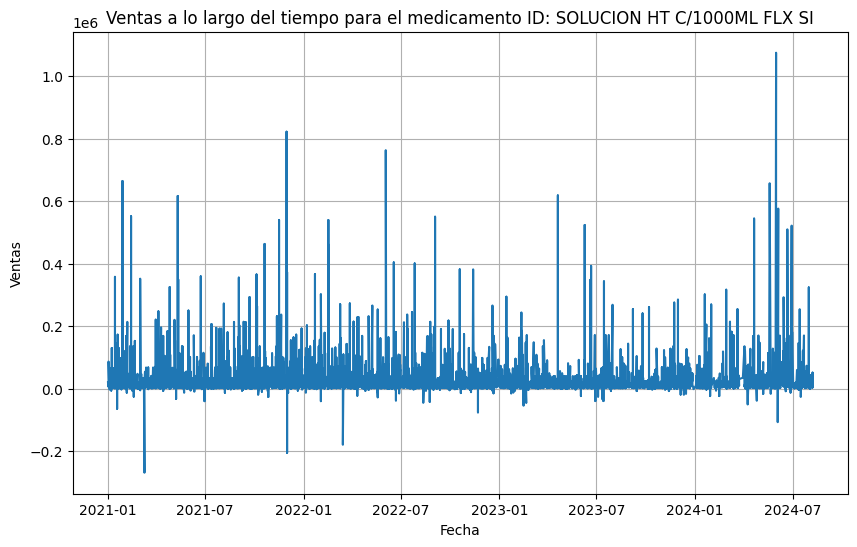

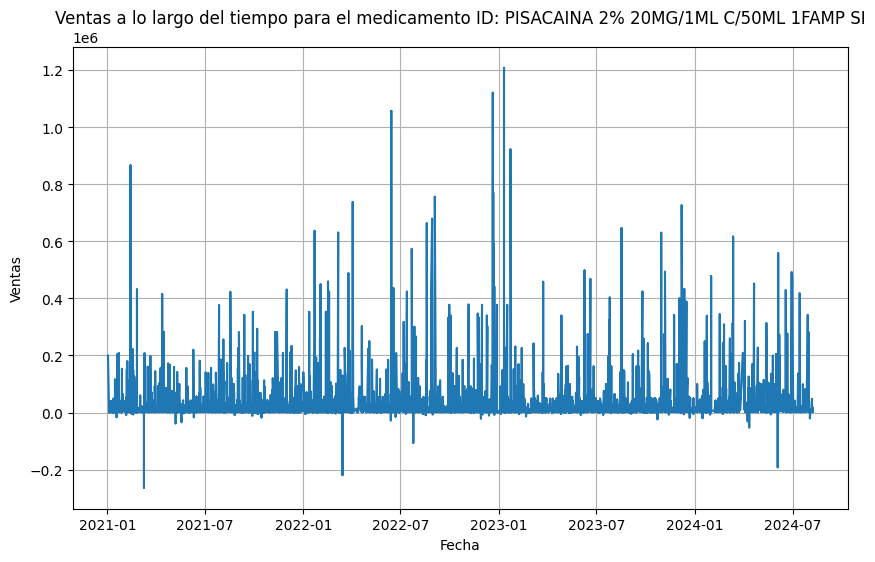

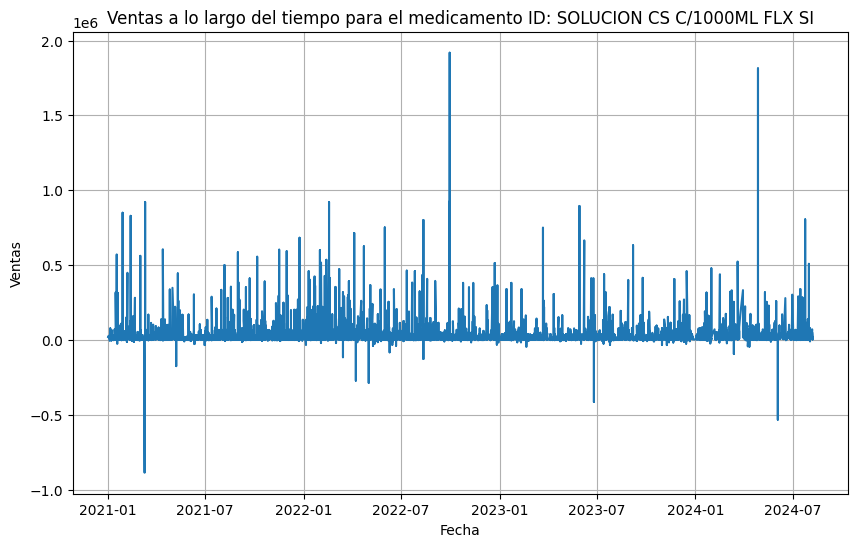

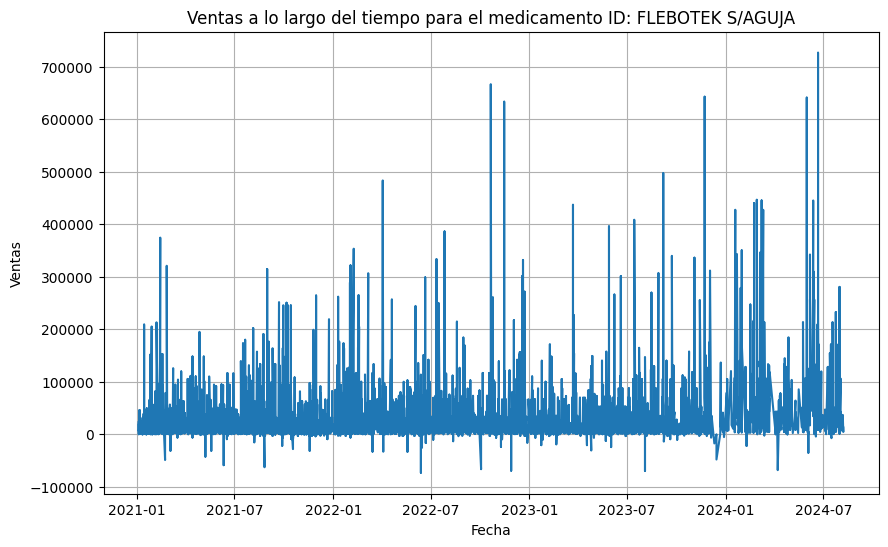

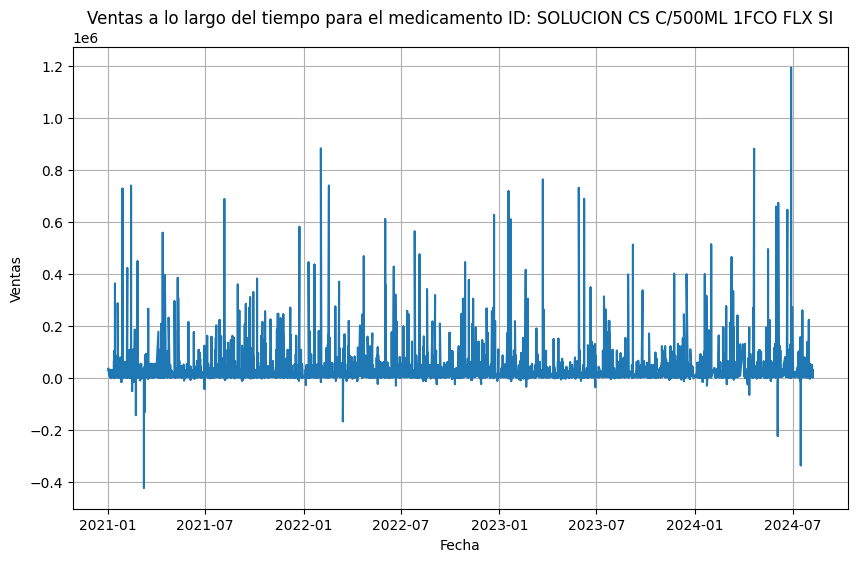

...

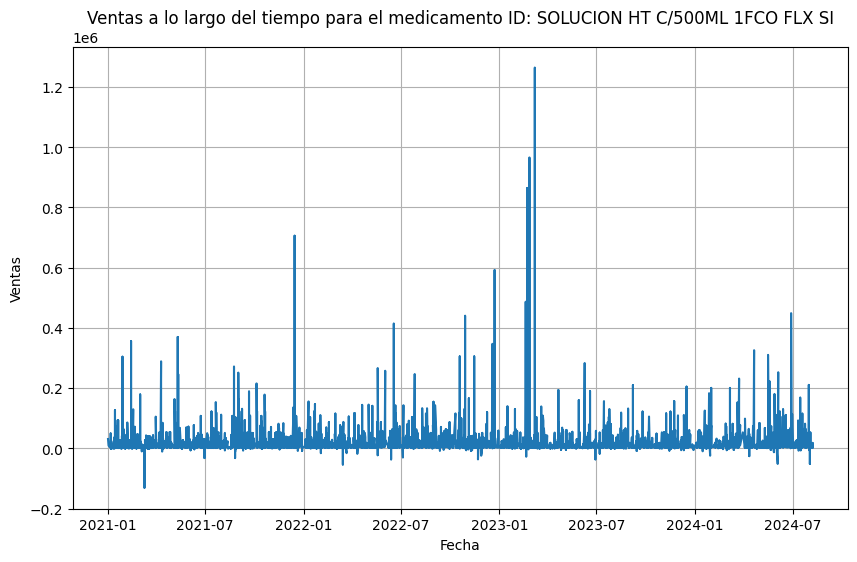

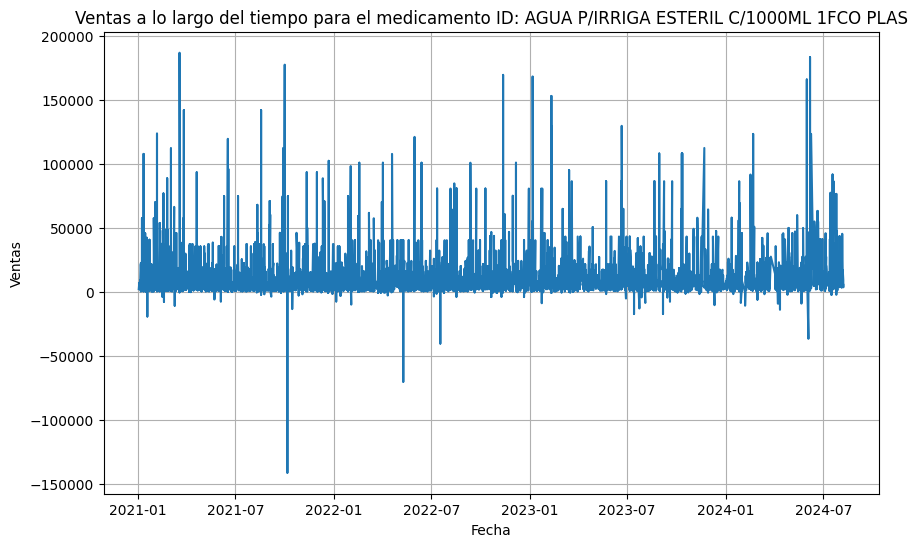

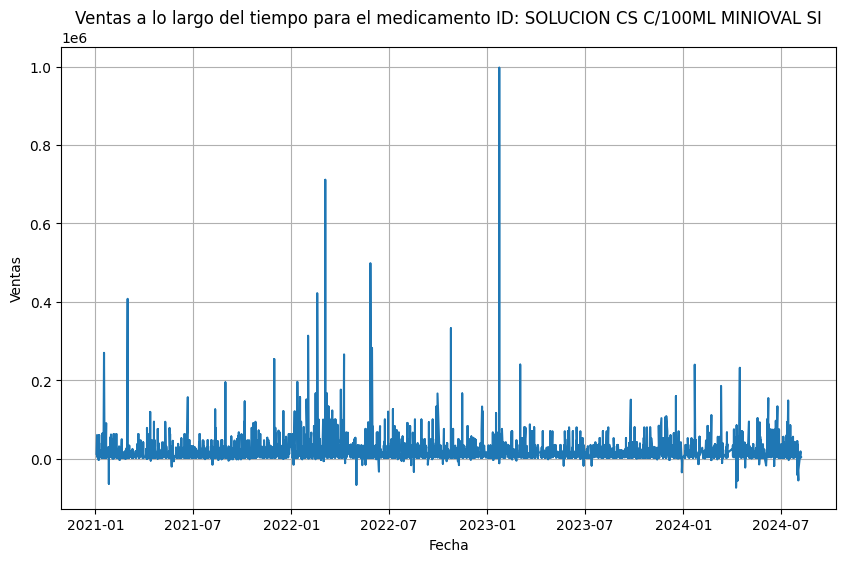

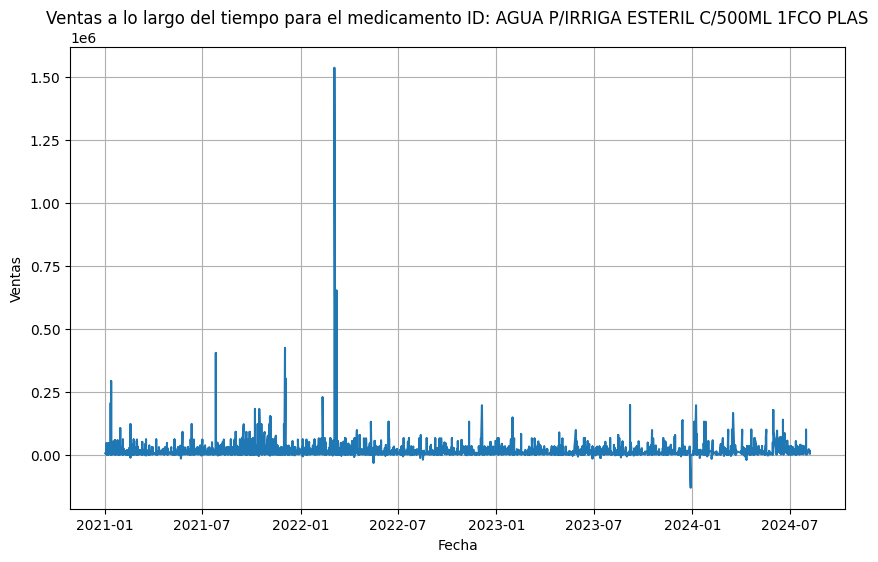

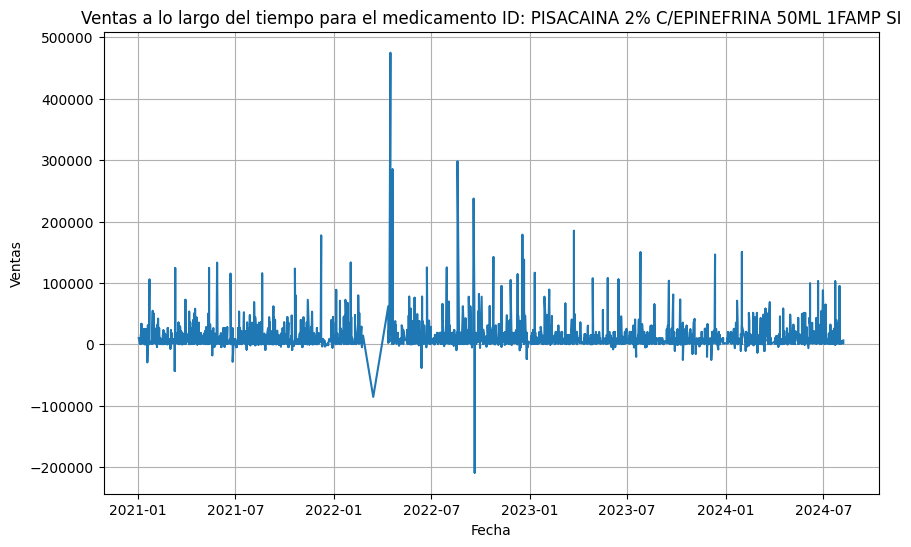

In [8]:
# Histogramas de ventas TOP 10 para cliente
top_10_ids=top10.index
data_top10=data[data['id_material'].isin(top_10_ids)]

for medicamento in top_10_ids:
    ventas_med=data_top10[data_top10['id_material']==medicamento]    
    ventas_med=ventas_med.sort_values('fecha')
    
    plt.figure(figsize=(10, 6))
    
    plt.plot(ventas_med['fecha'], ventas_med['ventas'])
    
    # Configurar el gráfico
    plt.title(f'Ventas a lo largo del tiempo para el medicamento ID: {medicamento}')
    plt.xlabel('Fecha')
    plt.ylabel('Ventas')
    plt.grid(True)
    plt.show()


# Gráficas Productos más comprados por cada Cliente

In [9]:
# Después de agrupar las filas, size() cuenta cuántas filas hay en cada grupo
cliente_prods= data.groupby(['id_cliente', 'id_material']).size().reset_index(name='conteo')

# Id de los clientes
clientes=cliente_prods['id_cliente'].unique()

In [10]:
print(cliente_prods)

       id_cliente                               id_material  conteo
0             234   AGUA P/IRRIGA ESTERIL C/500ML 1FCO PLAS      12
1             234          FLEBOTEK CON AGUJA EQ VENOCLISIS       4
2             234                          FLEBOTEK S/AGUJA       1
3             234         OTROZOL 500 5MG/ML C/100ML FLX SI      10
4             234      PENDIBEN COMP 1.2MU D/5ML C/FAMP SUI       1
...           ...                                       ...     ...
13997        7522               SOLUCION HT C/1000ML FLX SI       8
13998        7522        TAPON GIRATEK P/SITIO DE INYECCION       2
13999        7522  UREOPLAST RECOLECION DE ORINA C/2L BOLSA       2
14000        7522    UREOTEK RECOLECION DE ORINA C/2L BOLSA      14
14001        7522                             VALVULA LOPEZ       9

[14002 rows x 3 columns]


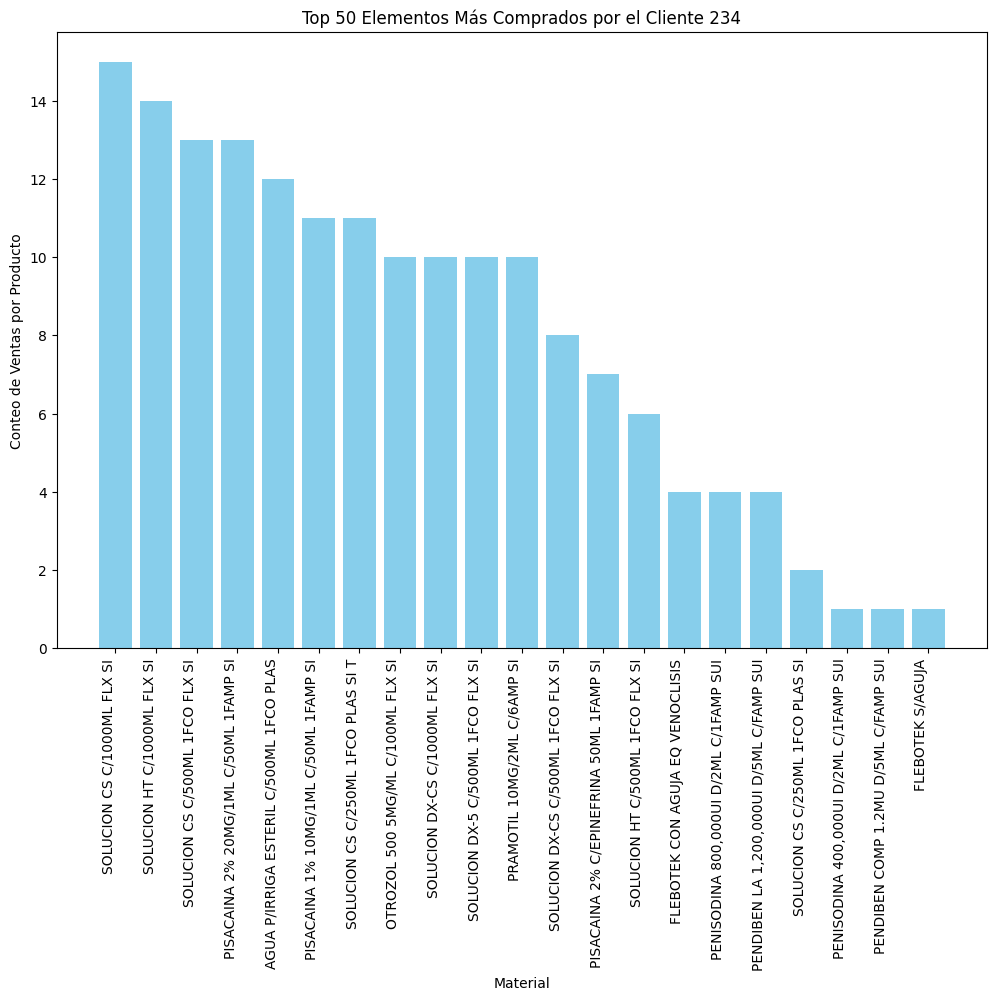

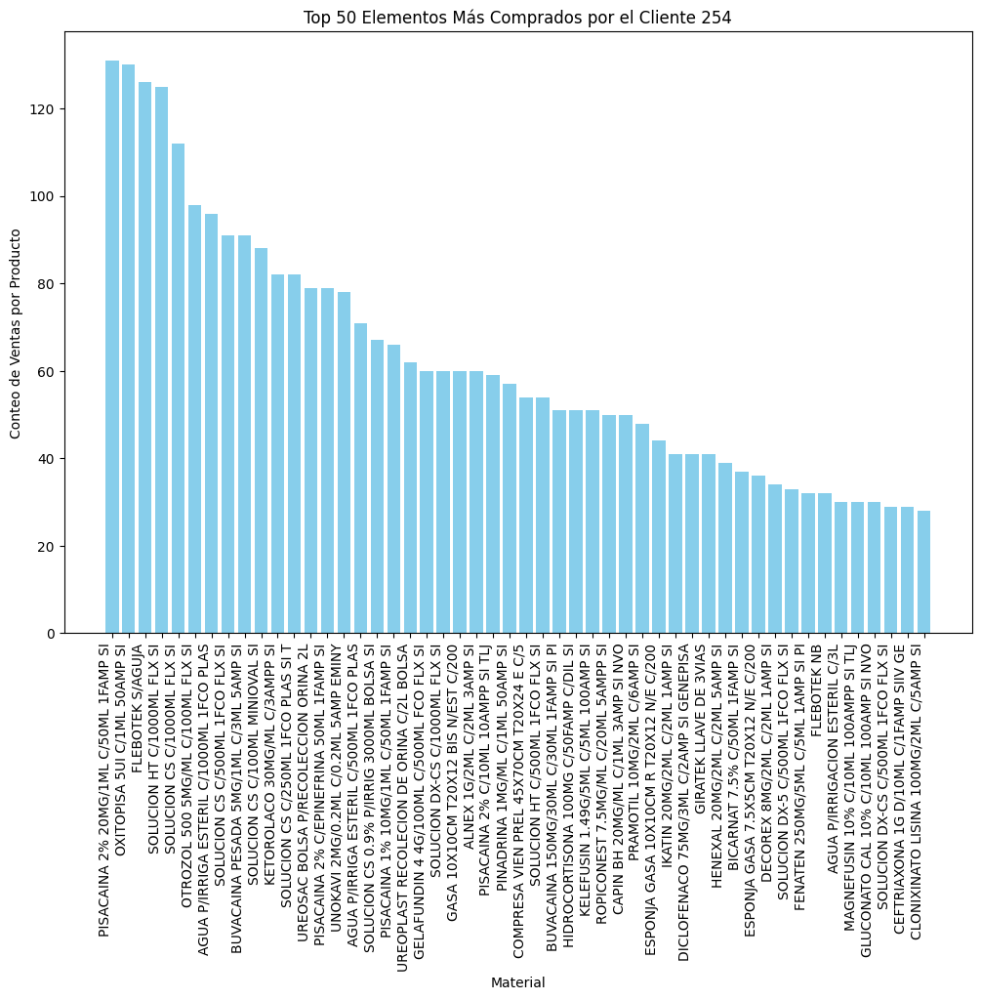

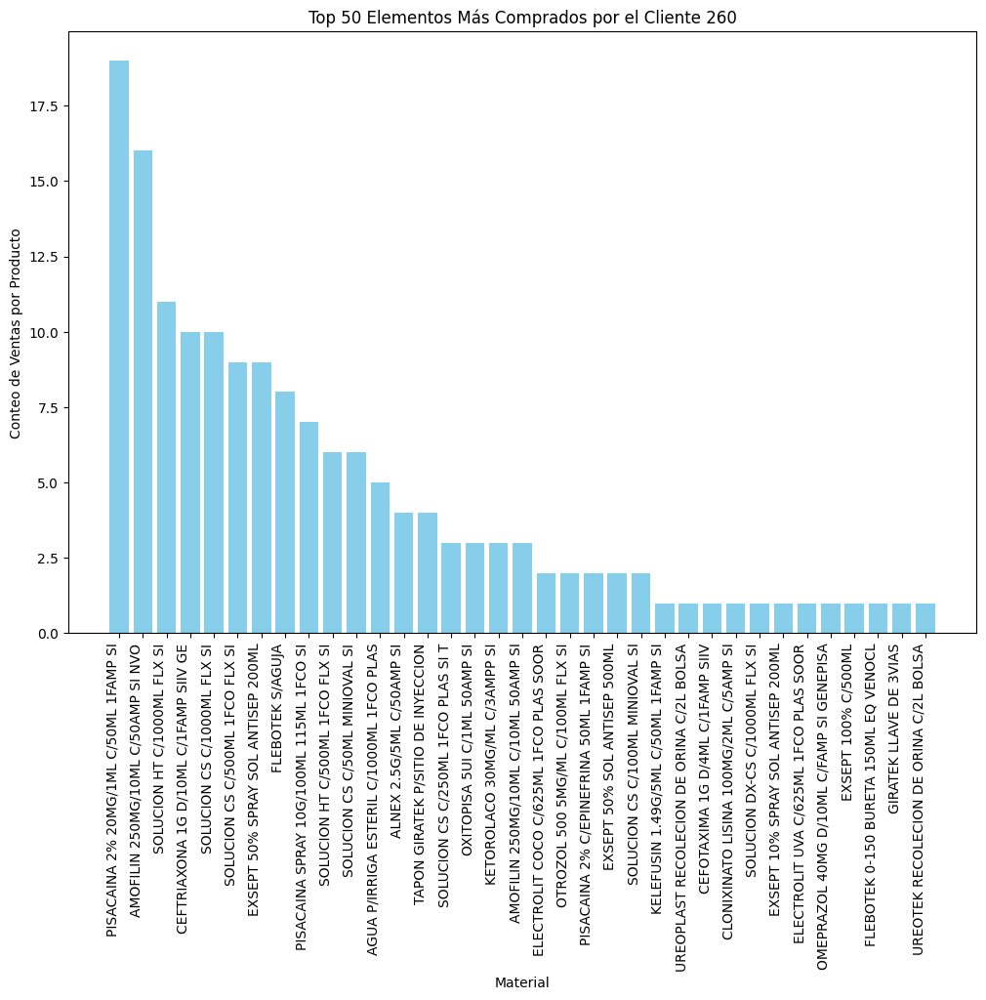

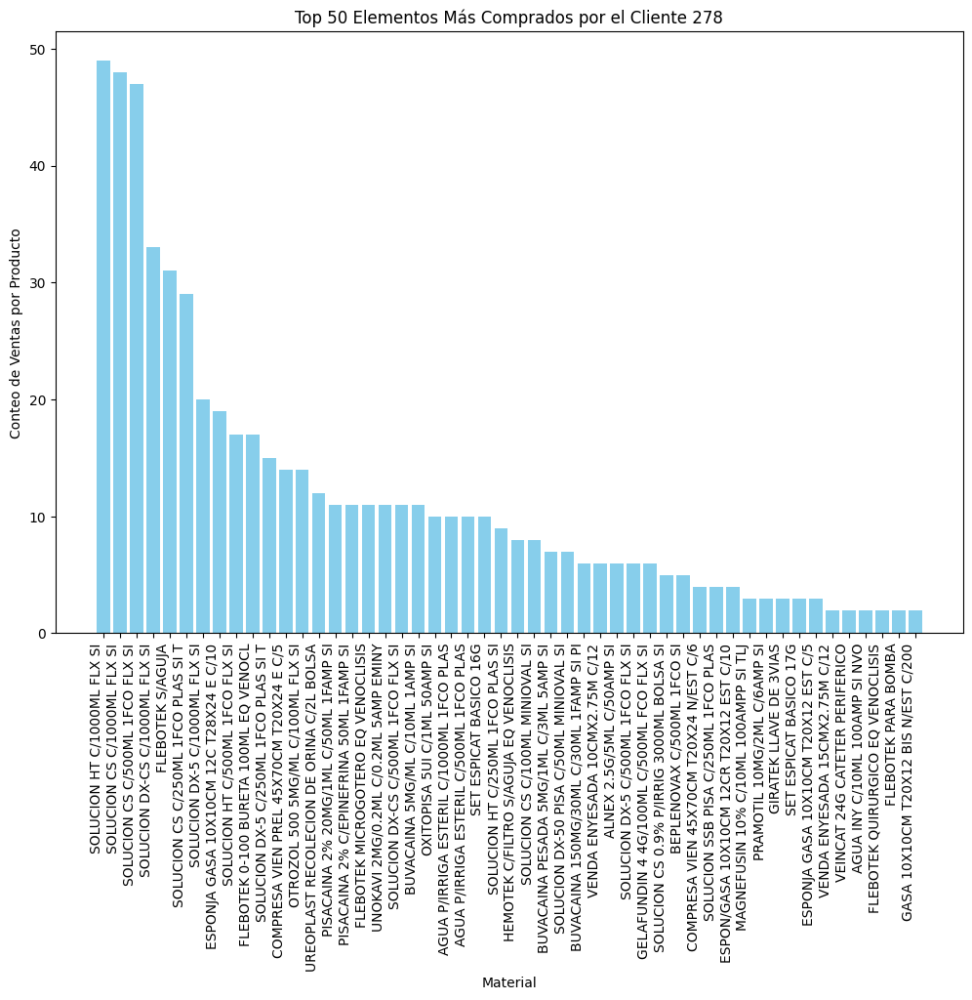

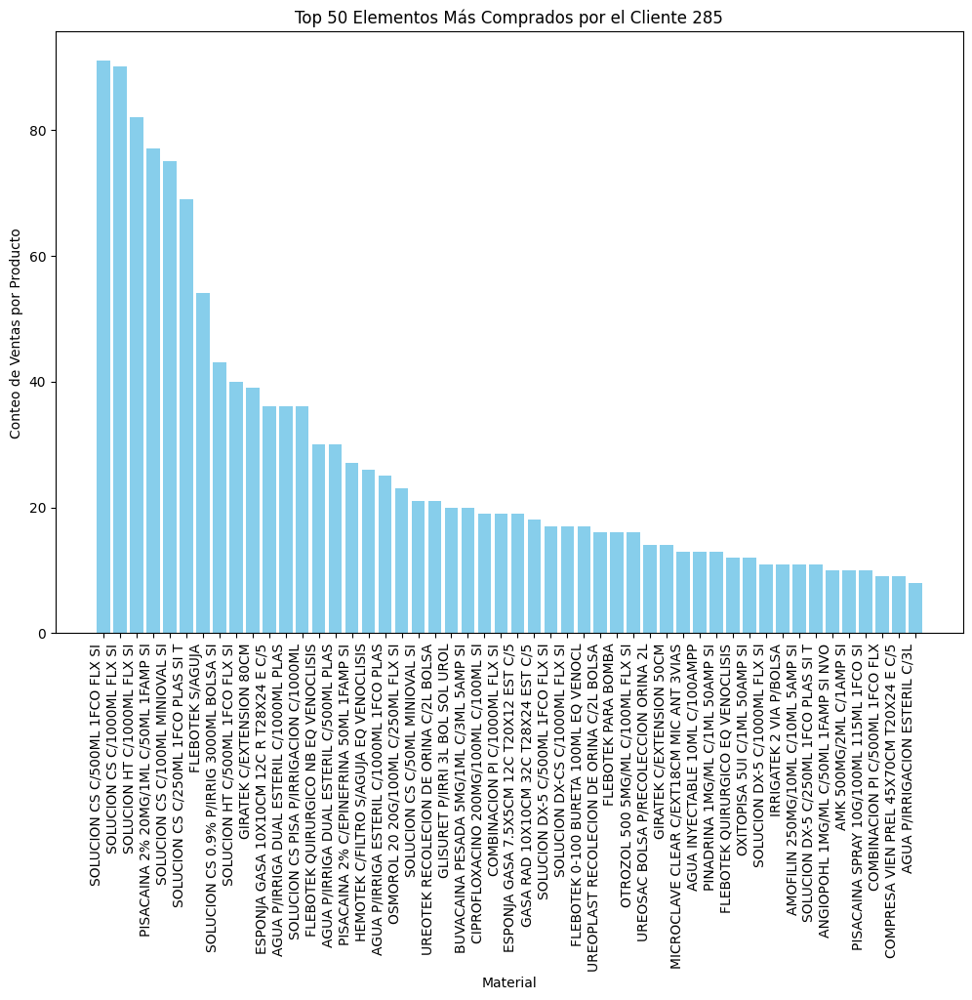

...

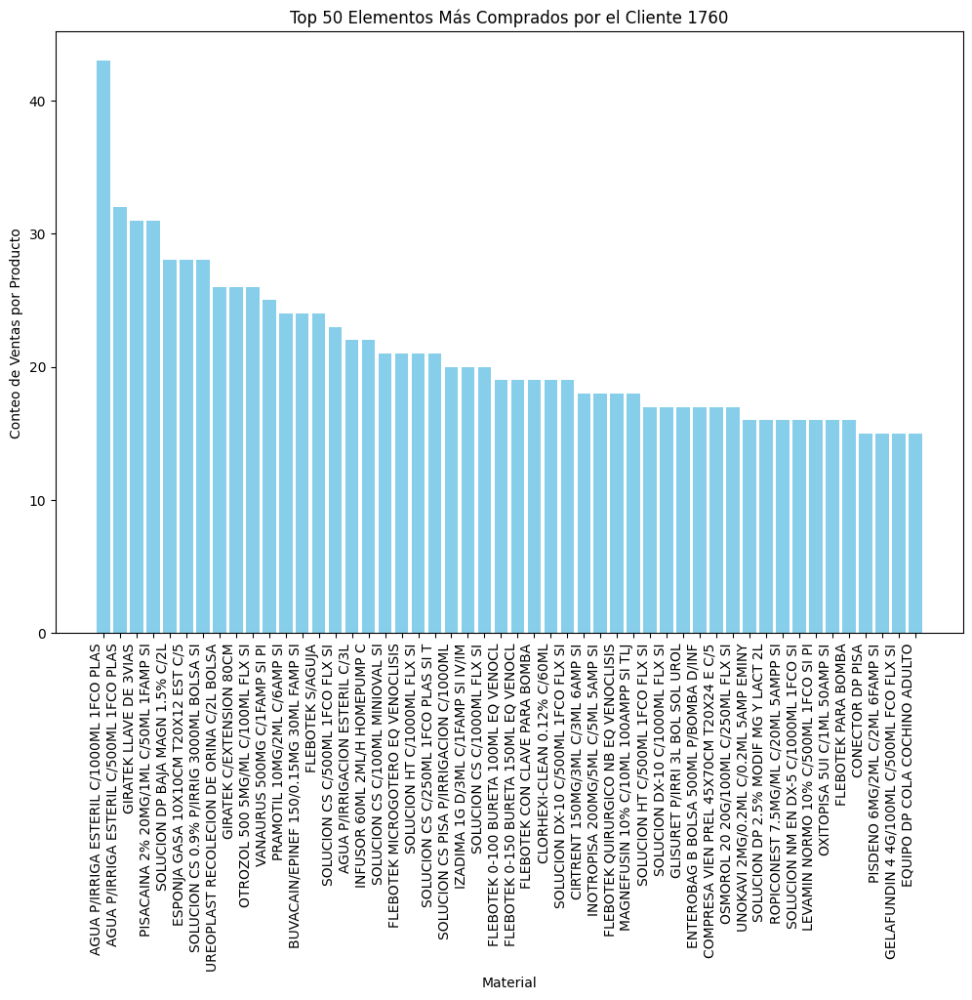

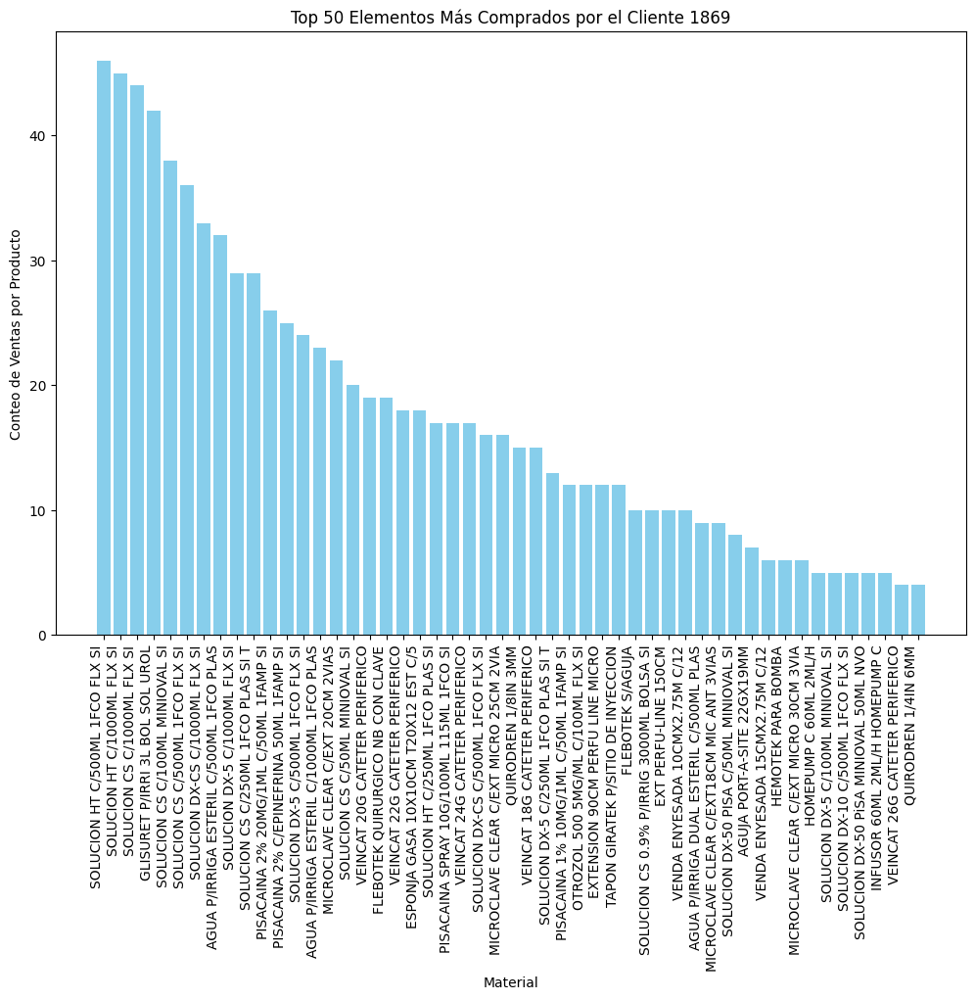

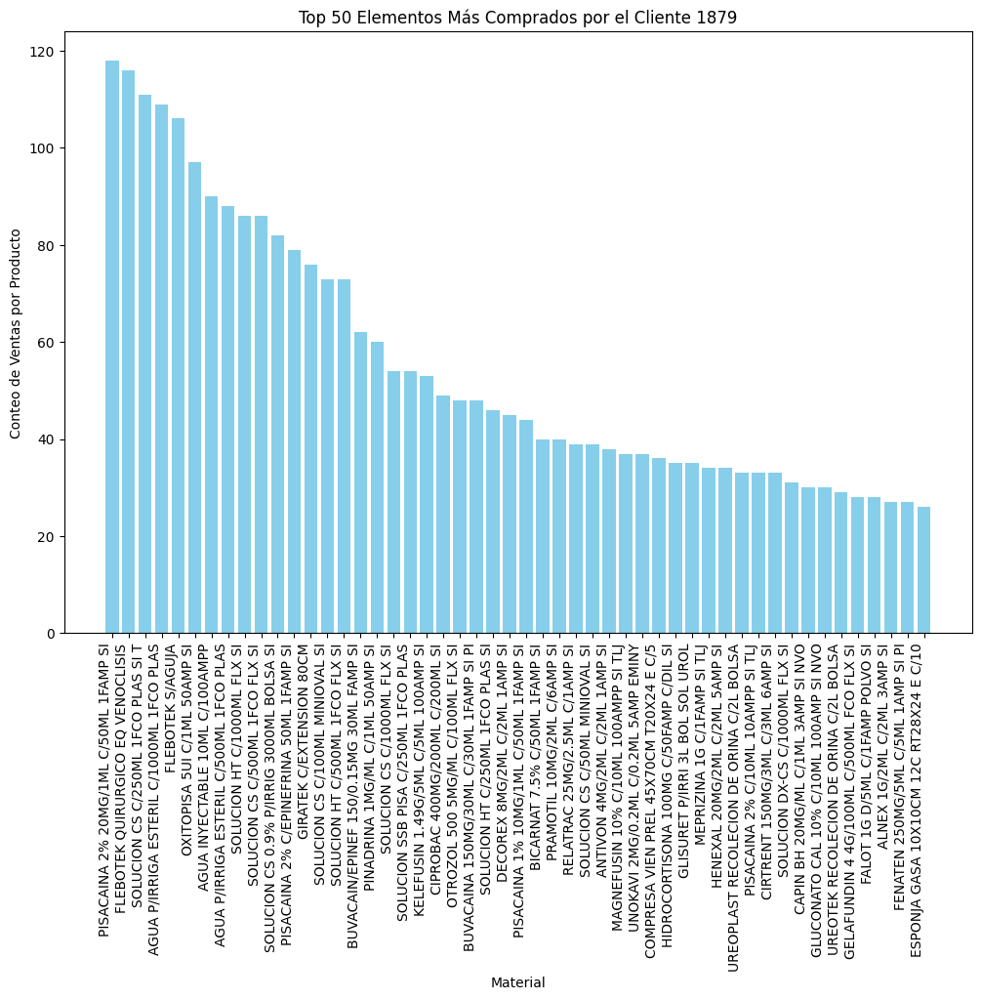

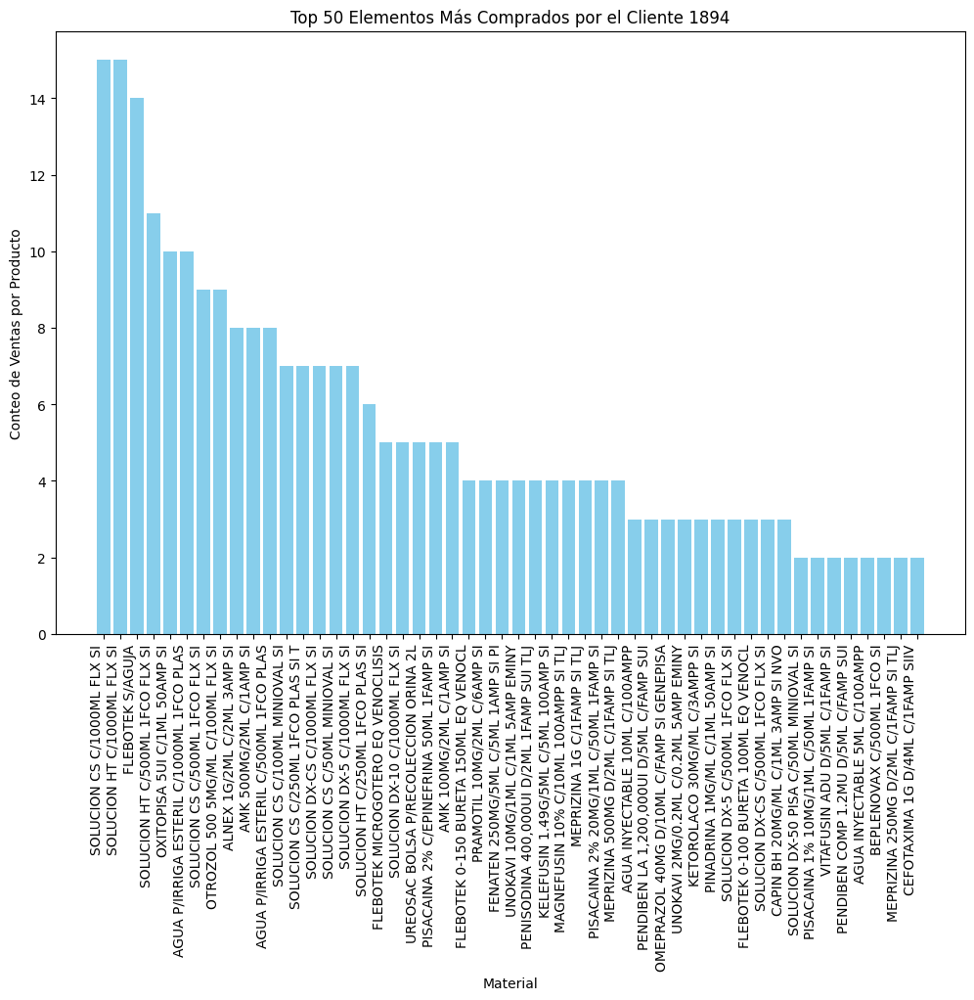

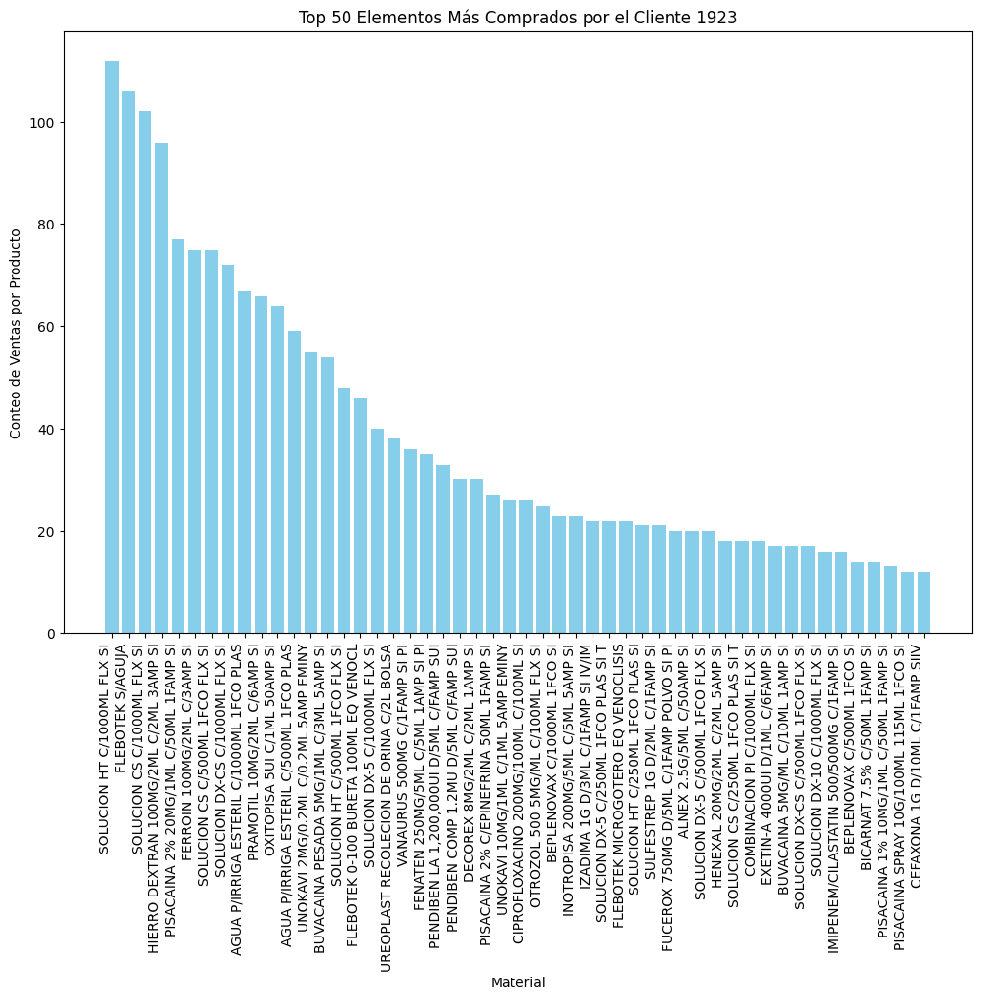

KeyboardInterrupt: 

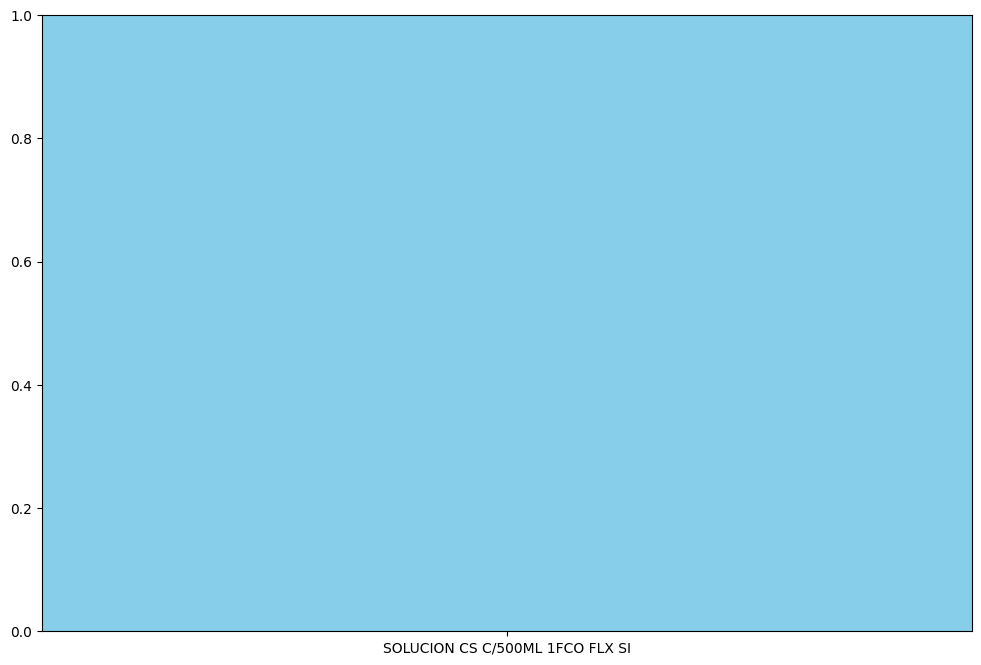

In [11]:
# Gráfico para los 50 elementos más comprados por cada cliente
for cliente in clientes:
    # Filtrar los datos para el cliente actual
    data_cliente = cliente_prods[cliente_prods['id_cliente'] ==cliente]
    
    # Ordenar por el conteo de compras en orden descendente y tomar los 50 primeros
    top_50=data_cliente.sort_values(by='conteo', ascending=False).head(50)
    
    plt.figure(figsize=(12, 8))
    plt.bar(top_50['id_material'].astype(str), top_50['conteo'], color='skyblue')
    
    plt.title(f'Top 50 Elementos Más Comprados por el Cliente {cliente}')
    plt.xlabel('Material')
    plt.ylabel('Conteo de Ventas por Producto')
    plt.xticks(rotation=90, ha='right')
    plt.show()

In [14]:
print(len(clientes))


158


# Gráficas Clientes que más compran cada Producto

In [15]:
# Después de agrupar las filas, size() cuenta cuántas filas hay en cada grupo
prod_clientes=data.groupby(['id_material', 'id_cliente'])['ventas'].sum().reset_index(name='ventas')

# Id de los clientes
materiales=prod_clientes['id_material'].unique()

In [16]:
print(prod_clientes)

                               id_material  id_cliente     ventas
0      0015 GLISURET SOLUCION P/IRRIG C/3L        7009   78537.60
1               ABEFEN 1G D/5ML C/1FAMP SI         254   30299.20
2               ABEFEN 1G D/5ML C/1FAMP SI         309   35963.00
3               ABEFEN 1G D/5ML C/1FAMP SI         386   12270.20
4               ABEFEN 1G D/5ML C/1FAMP SI         445   71311.80
...                                    ...         ...        ...
13997      ZN-FUSIN 1MG/ML C/10ML 5FAMP SI        7293    1317.24
13998      ZN-FUSIN 1MG/ML C/10ML 5FAMP SI        7430  136762.80
13999      ZN-FUSIN 1MG/ML C/10ML 5FAMP SI        7471  807714.98
14000      ZUFTIL 0.25MG/5ML C/5ML 5AMP SI        6750  322630.90
14001      ZUFTIL 0.25MG/5ML C/5ML 5AMP SI        7293   40722.20

[14002 rows x 3 columns]


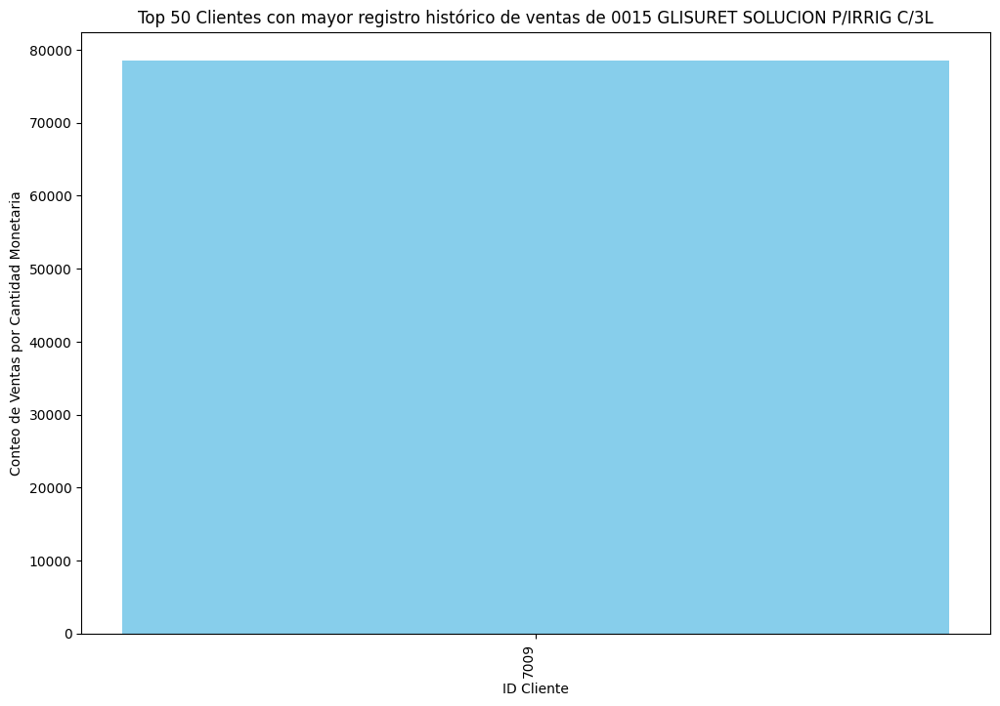

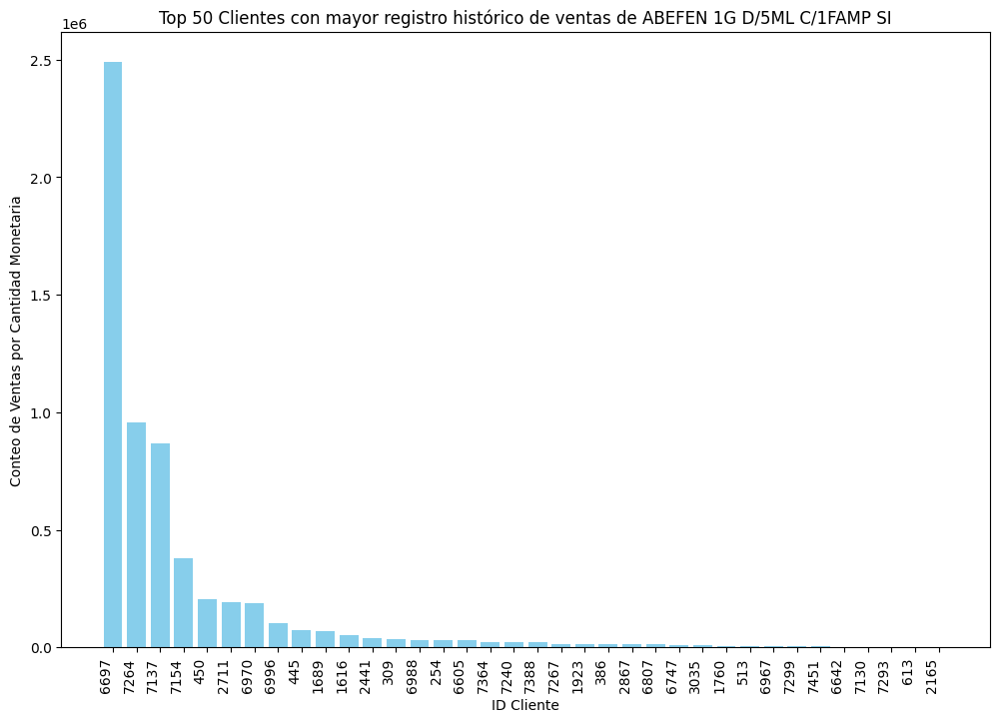

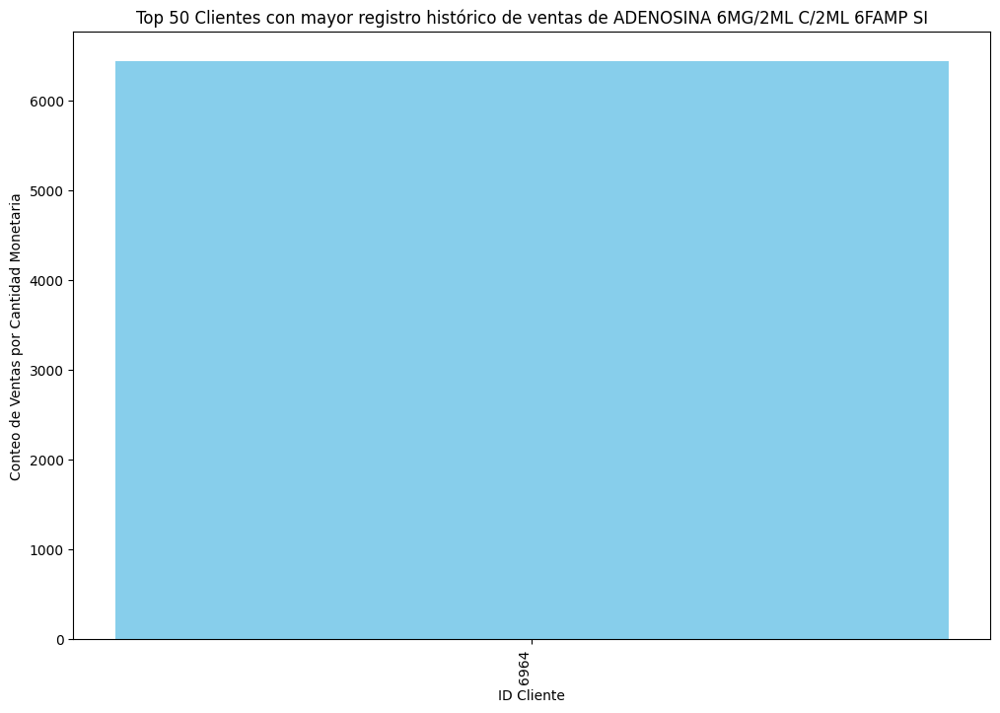

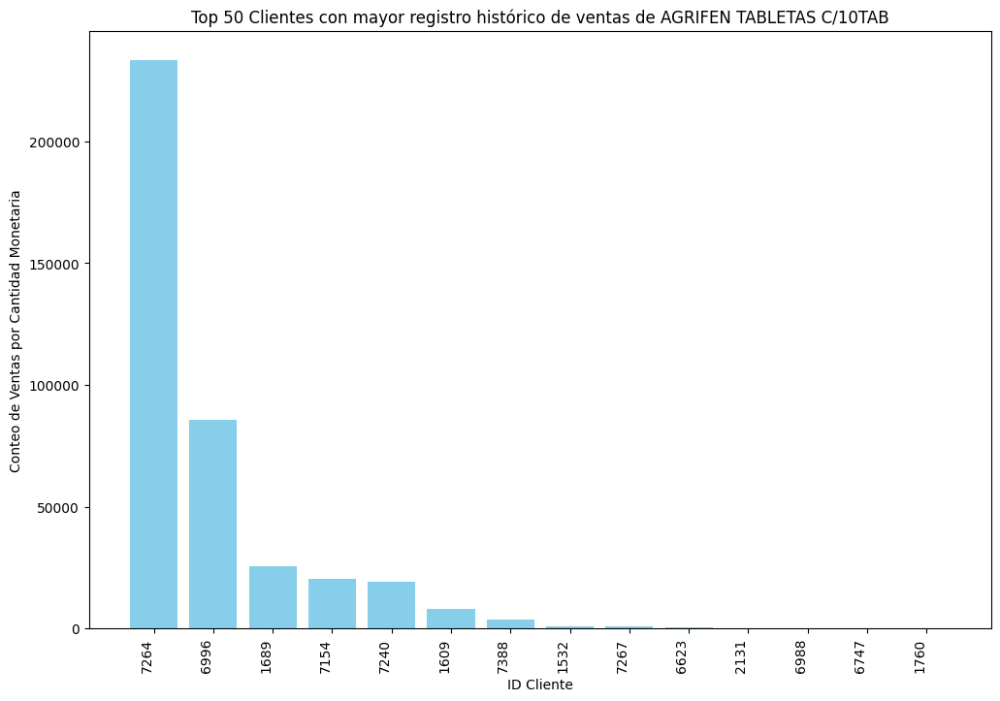

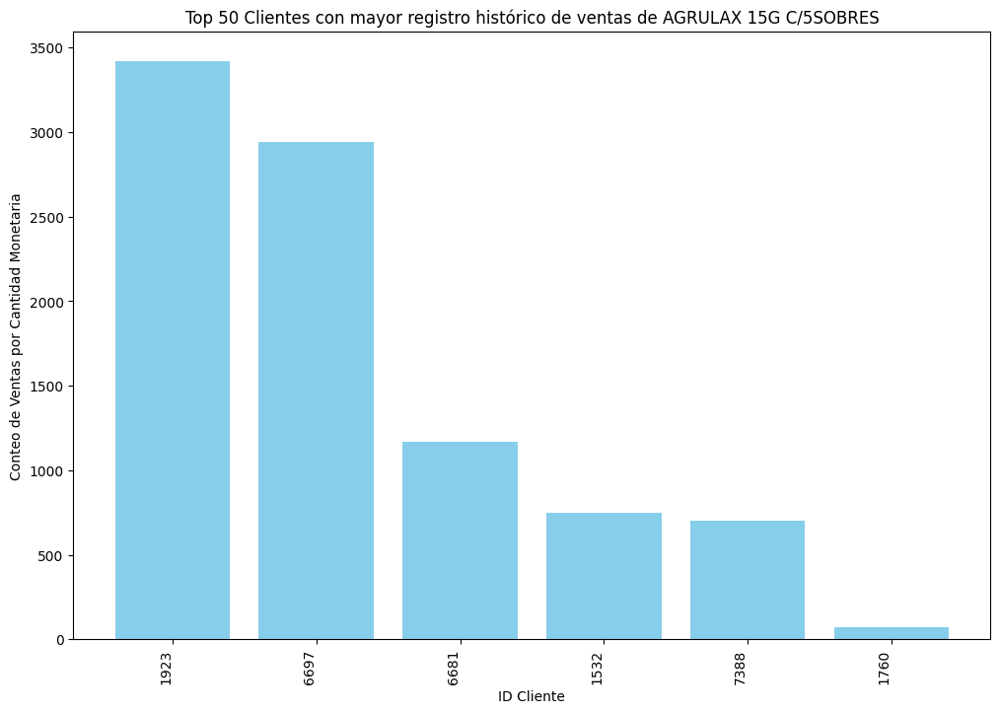

...

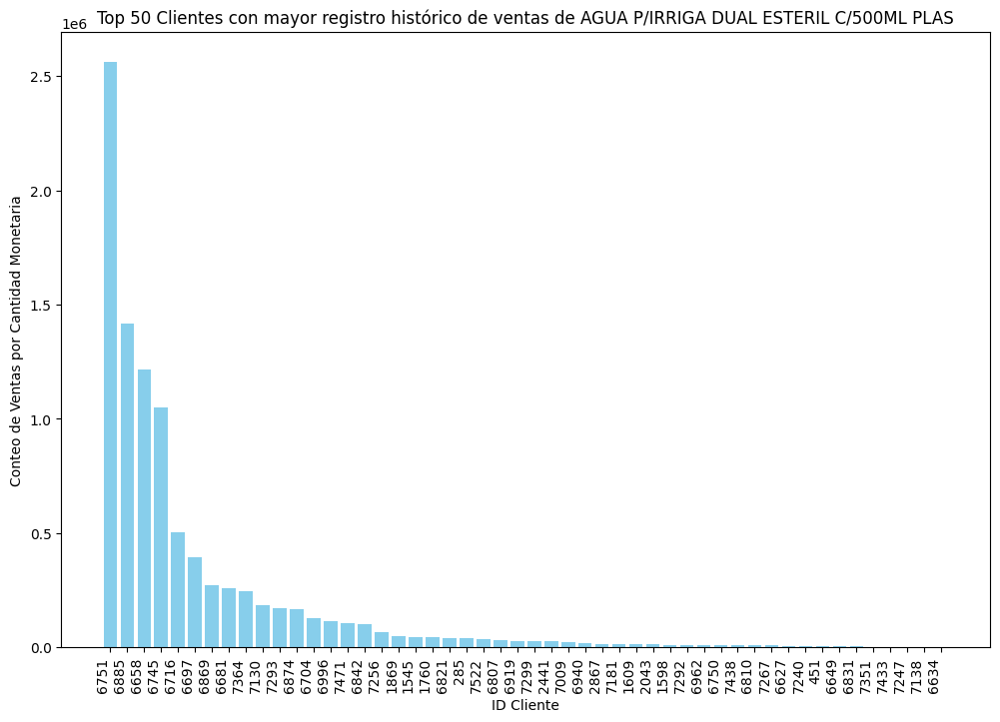

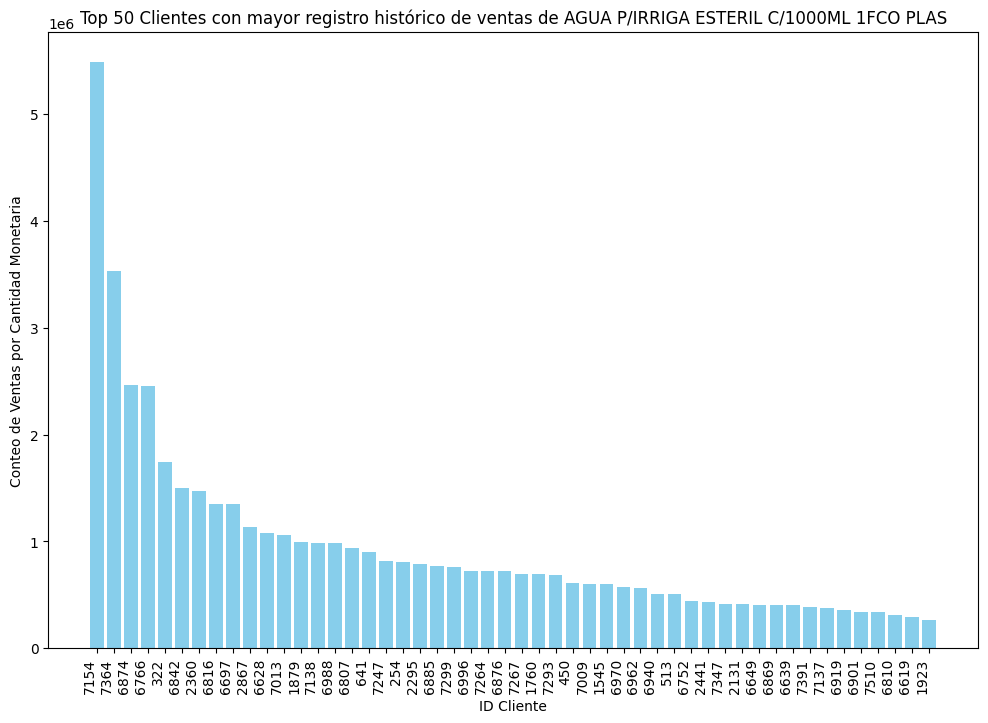

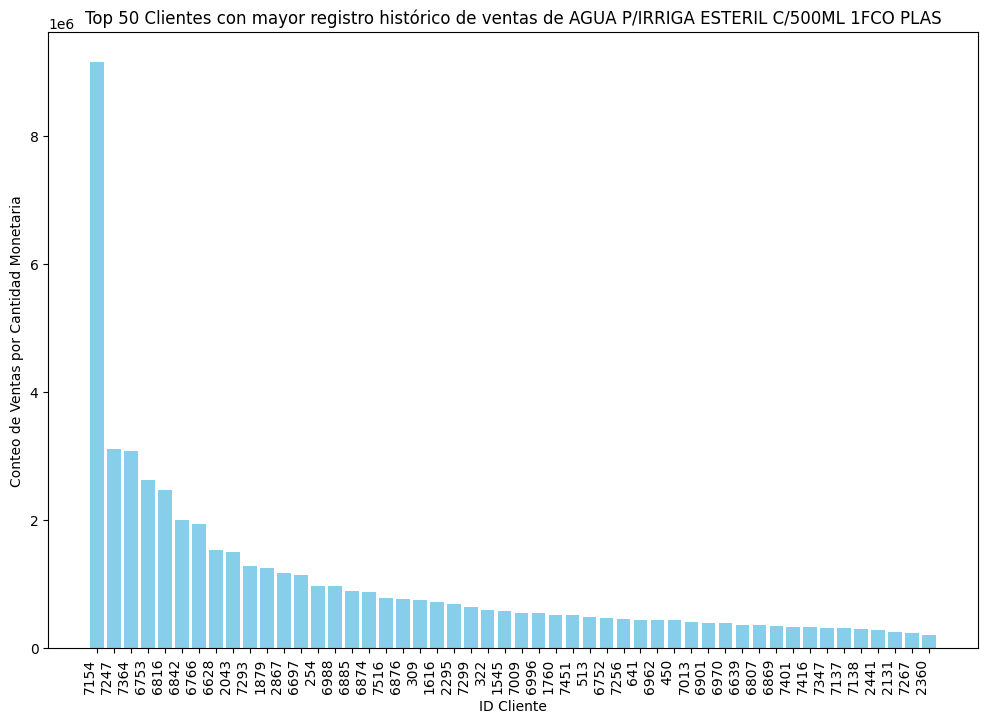

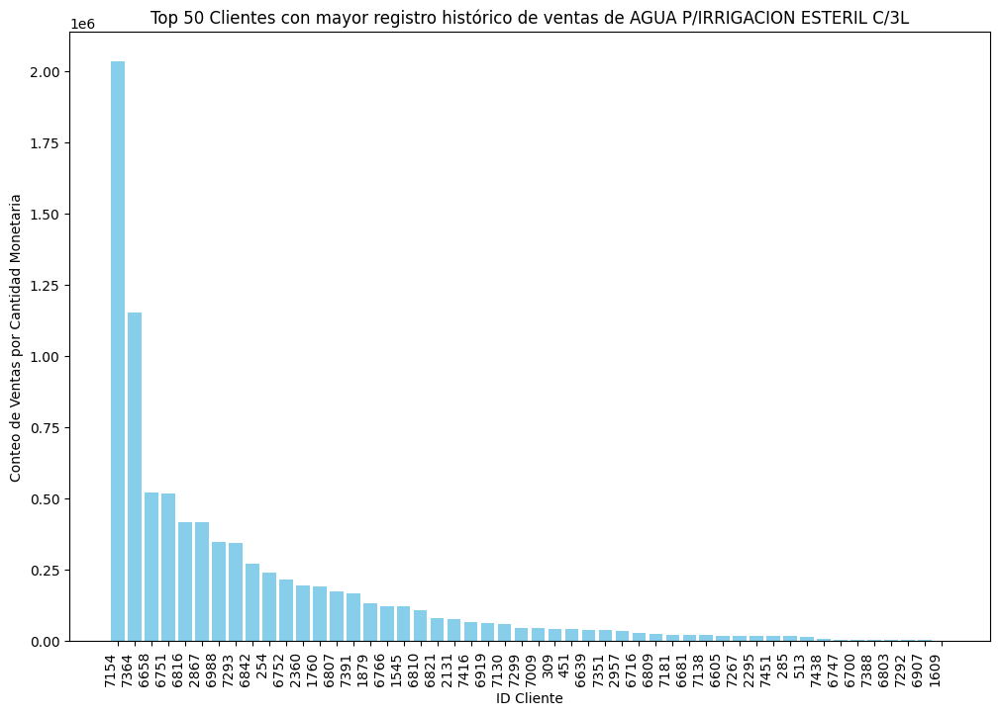

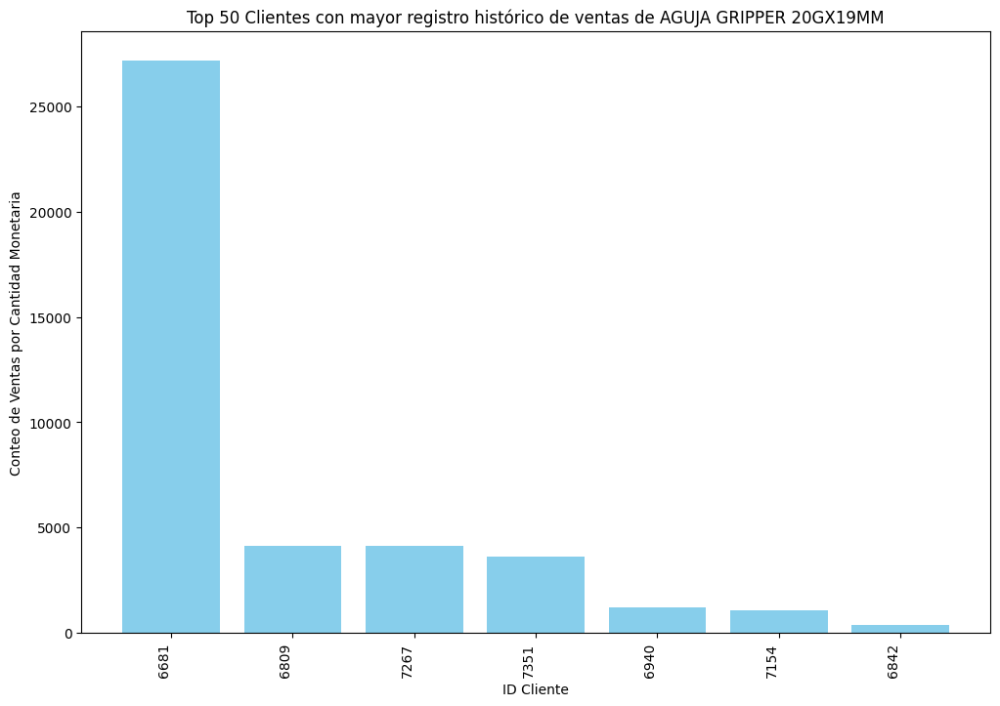

KeyboardInterrupt: 

In [17]:
# Gráfico para los 50 elementos más comprados por cada cliente
for material in materiales:
    # Filtrar los datos para el cliente actual
    data_producto= prod_clientes[prod_clientes['id_material']==material]
    
    # Ordenar por el conteo de compras en orden descendente y tomar los 50 primeros
    top_50=data_producto.sort_values(by='ventas', ascending=False).head(50)
    
    plt.figure(figsize=(12, 8))
    plt.bar(top_50['id_cliente'].astype(str), top_50['ventas'], color='skyblue')
    
    plt.title(f'Top 50 Clientes con mayor registro histórico de ventas de {material}')
    plt.xlabel('ID Cliente')
    plt.ylabel('Conteo de Ventas por Cantidad Monetaria')
    plt.xticks(rotation=90, ha='right')
    plt.show()

# Análisis Clientes

In [18]:
dataCL=data.sort_values(by=['id_cliente', 'fecha'],ascending=True)
dataCL

,fecha,id_material,id_cliente,ventas
203046,2021-01-08,SOLUCION HT C/1000ML FLX SI,234,13440.0
203050,2021-01-08,PRAMOTIL 10MG/2ML C/6AMP SI,234,5760.0
203056,2021-01-08,OTROZOL 500 5MG/ML C/100ML FLX SI,234,3100.0
203079,2021-01-08,SOLUCION DX-CS C/500ML 1FCO FLX SI,234,5280.0
203088,2021-01-08,PISACAINA 1% 10MG/1ML C/50ML 1FAMP SI,234,1440.0
...,...,...,...,...
103964,2024-07-25,FLEBOTEK PARA BOMBA,7522,-16976.4
104136,2024-07-25,TAPON GIRATEK P/SITIO DE INYECCION,7522,-891.0
103917,2024-08-07,ENTEROBAG B BOLSA 500ML P/BOMBA D/INF,7522,6551.0
104024,2024-08-07,ESPONJA GASA 7.5X5CM 12C T20X12 EST C/5,7522,1922.0


In [19]:
# Extraer el año y mes de la fecha
dataCL['mes'] = dataCL['fecha'].dt.to_period('M')

# Agrupar por id_cliente y mes, y sumar las ventas
dataCL = dataCL.groupby(['id_cliente', 'mes']).agg({
    'ventas': 'sum',
    'id_material': 'first'  # Mantener una columna que no se va a agrupar
}).reset_index()

# Mantener las columnas en el mismo orden
dataCL = dataCL[['mes', 'id_material', 'id_cliente', 'ventas']]

dataCL

,mes,id_material,id_cliente,ventas
0,2021-01,SOLUCION HT C/1000ML FLX SI,234,236800.00
1,2021-02,SOLUCION CS C/500ML 1FCO FLX SI,234,52819.28
2,2021-03,OTROZOL 500 5MG/ML C/100ML FLX SI,234,137301.88
3,2021-05,SOLUCION HT C/500ML 1FCO FLX SI,234,77376.32
4,2021-06,SOLUCION CS C/250ML 1FCO PLAS SI T,234,29828.36
...,...,...,...,...
5079,2024-04,ESPONJA GASA 7.5X5CM 12C T20X12 EST C/5,7522,16370.00
5080,2024-05,TAPON GIRATEK P/SITIO DE INYECCION,7522,24980.40
5081,2024-06,ESPONJA GASA 7.5X5CM 12C T20X12 EST C/5,7522,26425.60
5082,2024-07,MICROCLAVE CLEAR,7522,-3641.40


In [20]:
dataCL.nunique()

mes              44
id_material     377
id_cliente      158
ventas         5062
dtype: int64

In [21]:
iterator = dataCL.iterrows()
num = 0
for index, row in iterator:
    try:
        print(f'{num = }')
        next_index, next_row = next(iterator)
    
        ventas_1 = row['ventas']
        ventas_2 = next_row['ventas']
        
        id_cliente_1 = row['id_cliente']
        id_cliente_2 = next_row['id_cliente']
        
        if ventas_1 <= 0 and ventas_2 <= 0 and id_cliente_1 == id_cliente_2:
            print(f'{index = } {ventas_1 = },  {next_index = } {ventas_2 = }')
            #data.drop(index, inplace=True)
            #data.drop(next_index, inplace=True)
            if index in dataCL.index:
                dataCL.drop(index, inplace=True)
            if next_index in dataCL.index:
                dataCL.drop(next_index, inplace=True)

            num = num + 2
    
    except StopIteration:
        print(f'{num = }')
        

num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0


In [22]:
groupsCL=data.groupby('id_cliente')['fecha']
dict_of_CL={id_cliente: group.sort_values().unique() for id_cliente, group in groupsCL}

In [23]:
def calculate_days_difference(start_date, end_date):
    return (end_date - start_date).days

In [24]:
dict_matriz_confusionCL = {id: "" for id in dict_of_CL}

In [25]:
for id_cliente, dates in dict_of_CL.items():
    left = 0
    right = 1
    matriz = [[0,0],[0,0]]
    
    while right <= len(dates) - 1:
        
        if len(dates) == 1:
            break
        
        day_diff = calculate_days_difference(dates[left], dates[right])
        
        if day_diff == 1:
            matriz[0][0] += 1
            
        if day_diff == 2:
            matriz[0][1] += 1
            matriz[1][0] += 1
            
        if day_diff >= 3:
            matriz[0][1] += 1
            matriz[1][0] += 1
            matriz[1][1] += 1 * (day_diff - 2)
            
        left += 1
        right += 1
    
    if len(dates) == 1:
        print(f'deleted {id_cliente}')
        del dict_matriz_confusionCL[id_cliente]    
        
    else:
        dict_matriz_confusionCL[id_cliente] = matriz
        

deleted 6907
deleted 6995
deleted 7435


In [26]:
dict_matriz_transicionesCL = {id: "" for id in dict_matriz_confusionCL}

In [27]:
for id_cliente, m in dict_matriz_confusionCL.items():
    try:
        prob_AA = m[0][0]/(m[0][0] + m[0][1])
    except:
        prob_AA = 0
        
    try:
        prob_AD = m[0][1]/(m[0][0] + m[0][1])
    except:
        prob_AD = 0
        
    try:
        prob_DA = m[1][0]/(m[1][0] + m[1][1])
    except:
        prob_DA = 0
        
    try:
        prob_DD = m[1][1]/(m[1][0] + m[1][1])
    except:
        prob_DD = 0
        
    dict_matriz_transicionesCL[id_cliente] = [[prob_AA, prob_AD],[prob_DA, prob_DD]]
    
    print(f'{id_cliente = }, {len(dict_of_CL[id_cliente])}\n   A   D \n A{m[0]}\n D{m[1]}\n Proba de AA: {prob_AA: .4f}'
          f'\n Proba de AD: {prob_AD: .4f} \n Proba de DA: {prob_DA: .4f} \n Proba de DD: {prob_DD: .4f}\n ---------------------')

id_cliente = 234, 15
   A   D 
 A[0, 14]
 D[14, 313]
 Proba de AA:  0.0000
 Proba de AD:  1.0000 
 Proba de DA:  0.0428 
 Proba de DD:  0.9572
 ---------------------
id_cliente = 254, 466
   A   D 
 A[167, 298]
 D[298, 546]
 Proba de AA:  0.3591
 Proba de AD:  0.6409 
 Proba de DA:  0.3531 
 Proba de DD:  0.6469
 ---------------------
id_cliente = 260, 39
   A   D 
 A[0, 38]
 D[38, 1218]
 Proba de AA:  0.0000
 Proba de AD:  1.0000 
 Proba de DA:  0.0303 
 Proba de DD:  0.9697
 ---------------------
id_cliente = 278, 85
   A   D 
 A[0, 84]
 D[84, 1123]
 Proba de AA:  0.0000
 Proba de AD:  1.0000 
 Proba de DA:  0.0696 
 Proba de DD:  0.9304
 ---------------------
id_cliente = 285, 424
   A   D 
 A[146, 277]
 D[277, 607]
 Proba de AA:  0.3452
 Proba de AD:  0.6548 
 Proba de DA:  0.3133 
 Proba de DD:  0.6867
 ---------------------
id_cliente = 309, 407
   A   D 
 A[153, 253]
 D[253, 646]
 Proba de AA:  0.3768
 Proba de AD:  0.6232 
 Proba de DA:  0.2814 
 Proba de DD:  0.7186
 ---------

## Distribución estacionaria

In [28]:
# Comparar renglones de la matriz de transicion

n=np.linspace(6,1000, 300, dtype= 'int')

graph_dataCL = []
ClaudioCL = []

for d in dict_matriz_transicionesCL.keys():
    contador=0
    for i in range(len(n)):
        matriz_n=np.round(np.linalg.matrix_power(dict_matriz_transicionesCL[d],n[i]), 10)

        if np.all(matriz_n[0]==matriz_n[1]):
            break

        contador+=1
        
    if contador<=(len(n)):
        graph_dataCL.append([matriz_n[0][0],'A']) 
        graph_dataCL.append([matriz_n[0][1],'D']) 
        ClaudioCL.append([[matriz_n[0][0],matriz_n[0][1]], d])
        print(f'El vector de probabilidades pi({d})={matriz_n[0]}, con limite n={n[i]}')
    else:
        print('La matriz no converge')

El vector de probabilidades pi(234)=[0.04105572 0.95894428], con limite n=9
El vector de probabilidades pi(254)=[0.355233 0.644767], con limite n=6
El vector de probabilidades pi(260)=[0.02936631 0.97063369], con limite n=9
El vector de probabilidades pi(278)=[0.06506584 0.93493416], con limite n=9
El vector de probabilidades pi(285)=[0.32364193 0.67635807], con limite n=9
El vector de probabilidades pi(309)=[0.31111111 0.68888889], con limite n=12
El vector de probabilidades pi(311)=[0.05645161 0.94354839], con limite n=9
El vector de probabilidades pi(322)=[0.07872175 0.92127825], con limite n=6
El vector de probabilidades pi(386)=[0.17795845 0.82204155], con limite n=6
El vector de probabilidades pi(445)=[0.15139442 0.84860558], con limite n=9
El vector de probabilidades pi(450)=[0.13389441 0.86610559], con limite n=12
El vector de probabilidades pi(451)=[0.05877804 0.94122196], con limite n=6
El vector de probabilidades pi(513)=[0.19648318 0.80351682], con limite n=9
El vector de p

## Gráficos de pastel Activación/Desactivación Cliente

234


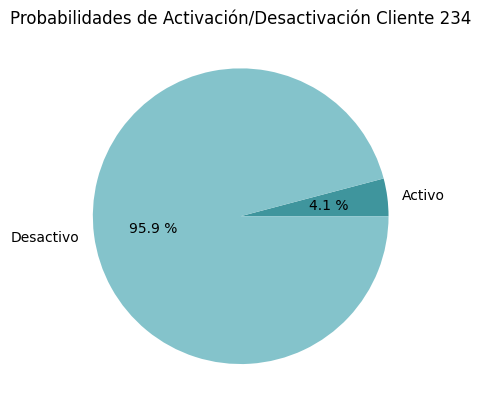

254


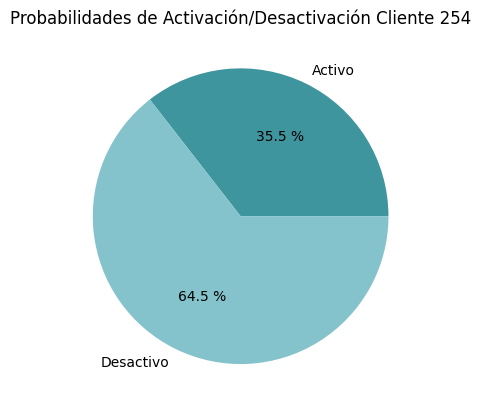

260


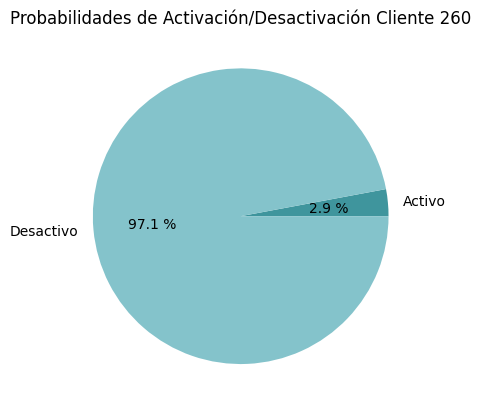

278


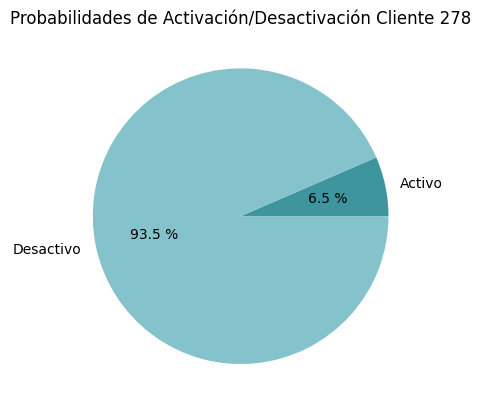

285


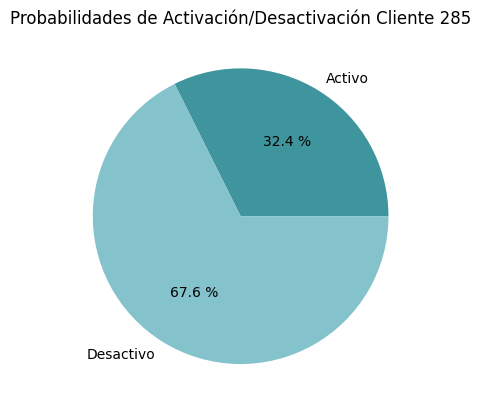

In [29]:
# Gráficos para comparar probabilidades estacionarias de los estados
for i in ClaudioCL[:5]:
    id=i[1]
    proba=i[0]
    print(id)

    estados=['Activo', 'Desactivo']
    plt.pie(proba, labels=estados, autopct="%0.1f %%", colors=['#3f959d','#84c3cb'])
    plt.title(f'Probabilidades de Activación/Desactivación Cliente {id}')
    plt.axis()
    plt.show()

## Convergencia de las probabilidades Material

In [ ]:
kCL=list(dict_matriz_transicionesCL.keys())

keyCL=np.random.choice(kCL, size=3)
keyCL

In [30]:
from matplotlib.ticker import ScalarFormatter

# Configurar el formateador para evitar notación científica
formatter = ScalarFormatter(useMathText=False)
formatter.set_scientific(False)

pi_0 = np.array([0.3, 0.7])
for d in keyCL:
    proba_activo = []
    proba_desactivo = []

    contador = 0
    for i in range(len(n)):
        matriz_n = np.round(np.linalg.matrix_power(dict_matriz_transicionesCL[d], n[i]), 10)
        pi_n = np.linalg.matmul(pi_0, matriz_n)

        proba_activo.append(pi_n[0])
        proba_desactivo.append(pi_n[1])

        if np.all(matriz_n[0] == matriz_n[1]):
            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

            # Probabilidad de activación
            ax1.plot(n[:i+1], proba_activo, label='Probabilidad de activación', color='green')
            ax1.set_title(f'Convergencia de Activación para Cliente {d}')
            ax1.set_xlabel('Iteraciones')
            ax1.set_ylabel('Probabilidades')
            ax1.legend()

            # Configurar el eje y para no usar notación científica
            ax1.yaxis.set_major_formatter(formatter)
            ax1.ticklabel_format(style='plain', axis='y')  # Forzar el estilo plano (sin notación científica)

            texto_info1 = f'Prob. estacionaria: {pi_n[0]:.3f}'
            ax1.text(0.95, 0.5, texto_info1, transform=ax1.transAxes,
                     fontsize=10, verticalalignment='top', horizontalalignment='right',
                     bbox=dict(boxstyle='round,pad=0.3', edgecolor='black', facecolor='lightgray'))

            # Probabilidad de desactivación
            ax2.plot(n[:i+1], proba_desactivo, label='Probabilidad de desactivación', color='red')
            ax2.set_title(f'Convergencia de Desactivación para Cliente {d}')
            ax2.set_xlabel('Iteraciones')
            ax2.set_ylabel('Probabilidades')
            ax2.legend()

            # Configurar el eje y para no usar notación científica
            ax2.yaxis.set_major_formatter(formatter)
            ax2.ticklabel_format(style='plain', axis='y')  # Forzar el estilo plano (sin notación científica)

            texto_info2 = f'Prob. estacionaria: {pi_n[1]:.3f}'
            ax2.text(0.95, 0.5, texto_info2, transform=ax2.transAxes,
                     fontsize=10, verticalalignment='top', horizontalalignment='right',
                     bbox=dict(boxstyle='round,pad=0.3', edgecolor='black', facecolor='lightgray'))

            plt.tight_layout()
            plt.show()

            break

        contador += 1

    if contador <= (len(n)):
        print(f'El vector de probabilidades pi({d})={matriz_n[0]}, con limite n={n[i]}')
    else:
        print('La matriz no converge')


NameError: name 'keyCL' is not defined

## Gráficos de distribución de las probabilidades Clientes 

In [31]:
Claudio_pd = pd.DataFrame(ClaudioCL, columns=['Prob Est ([A, D])', 'id_material'])
Claudio_pd

,"Prob Est ([A, D])",id_material
0,"[0.0410557185, 0.9589442815]",234
1,"[0.3552330023, 0.6447669977]",254
2,"[0.029366306, 0.970633694]",260
3,"[0.0650658404, 0.9349341596]",278
4,"[0.3236419281, 0.6763580719]",285
...,...,...
150,"[0.0945179584, 0.9054820416]",7451
151,"[0.1010719755, 0.8989280245]",7471
152,"[0.0765110941, 0.9234889059]",7510
153,"[0.0388059701, 0.9611940299]",7516


In [32]:
len(dict_matriz_transicionesCL)

155

In [33]:
graph_dataCL

[[0.0410557185, 'A'],
 [0.9589442815, 'D'],
 [0.3552330023, 'A'],
 [0.6447669977, 'D'],
 [0.029366306, 'A'],
 [0.970633694, 'D'],
 [0.0650658404, 'A'],
 [0.9349341596, 'D'],
 [0.3236419281, 'A'],
 [0.6763580719, 'D'],
 [0.3111111111, 'A'],
 [0.6888888889, 'D'],
 [0.0564516129, 'A'],
 [0.9435483871, 'D'],
 [0.0787217459, 'A'],
 [0.9212782541, 'D'],
 [0.1779584463, 'A'],
 [0.8220415537, 'D'],
 [0.1513944223, 'A'],
 [0.8486055777, 'D'],
 [0.1338944147, 'A'],
 [0.8661055853, 'D'],
 [0.0587780356, 'A'],
 [0.9412219644, 'D'],
 [0.1964831804, 'A'],
 [0.8035168196, 'D'],
 [0.0082644628, 'A'],
 [0.9917355372, 'D'],
 [0.0690737834, 'A'],
 [0.9309262166, 'D'],
 [0.1202775636, 'A'],
 [0.8797224364, 'D'],
 [0.0287267081, 'A'],
 [0.9712732919, 'D'],
 [0.0572956455, 'A'],
 [0.9427043545, 'D'],
 [0.0506329114, 'A'],
 [0.9493670886, 'D'],
 [0.1125674634, 'A'],
 [0.8874325366, 'D'],
 [0.0711462451, 'A'],
 [0.9288537549, 'D'],
 [0.0736196319, 'A'],
 [0.9263803681, 'D'],
 [0.1949458484, 'A'],
 [0.80505415

In [34]:
graph_data_1 = pd.DataFrame(graph_dataCL, columns=['Prob', 'Estado'])
graph_data_1

,Prob,Estado
0,0.041056,A
1,0.958944,D
2,0.355233,A
3,0.644767,D
4,0.029366,A
...,...,...
305,0.923489,D
306,0.038806,A
307,0.961194,D
308,0.050459,A


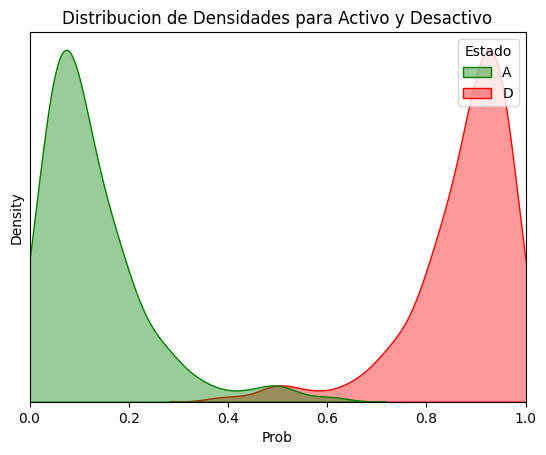

In [35]:
# With transparency
colors = ['g','r']
sns.kdeplot(data=graph_data_1, x="Prob", hue="Estado", fill=True, common_norm=False, alpha=0.4, palette=colors)
plt.xlim(0, 1)
plt.title("Distribucion de Densidades para Activo y Desactivo")
plt.yticks([])
plt.show()

/var/folders/6k/ggtrwjgn11ng2t9mrds12n_m0000gn/T/ipykernel_93206/3096835485.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(y="Estado", x="Prob", data=graph_data_1, fill=False, palette=colors, width=1, linewidth=1)


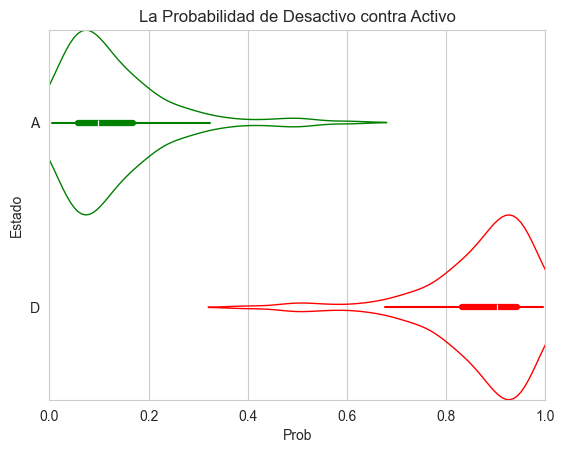

In [36]:
sns.set_style('whitegrid')
sns.violinplot(y="Estado", x="Prob", data=graph_data_1, fill=False, palette=colors, width=1, linewidth=1)
plt.title("La Probabilidad de Desactivo contra Activo")
plt.xlim(0, 1)
plt.show()

In [37]:
# Numero de prob. Estacionarias donde A > 0.50

filtered_df_A = graph_data_1[graph_data_1['Estado']=="A"]

Q_A_025 = filtered_df_A.query('Prob < 0.25').shape[0]
Q_A_050 = filtered_df_A.query('Prob < 0.5').shape[0]
Q_A_075 = filtered_df_A.query('Prob < 0.75').shape[0]
Q_A_100 = filtered_df_A.query('Prob < 1').shape[0]


print(f'Quantiles 0 - 25 % de Datos de A = {Q_A_025:.0f}\n'
      f'Quantiles 25 - 50 % de Datos de A = {Q_A_050 - Q_A_025:.0f}\n'
      f'Quantiles 50 - 75 % de Datos de A = {Q_A_075 - Q_A_050:.0f}\n'
      f'Quantiles 75 - 100 % de Datos de A = {Q_A_100 - Q_A_075:.0f}\n')

Quantiles 0 - 25 % de Datos de A = 138
Quantiles 25 - 50 % de Datos de A = 14
Quantiles 50 - 75 % de Datos de A = 3
Quantiles 75 - 100 % de Datos de A = 0



In [38]:
# Numero de prob. Estacionarias donde D > 0.50

filtered_df_D = graph_data_1[graph_data_1['Estado']=="D"]

Q_D_025 = filtered_df_D.query('Prob < 0.25').shape[0]
Q_D_050 = filtered_df_D.query('Prob < 0.5').shape[0]
Q_D_075 = filtered_df_D.query('Prob < 0.75').shape[0]
Q_D_100 = filtered_df_D.query('Prob < 1').shape[0]

print(f'Quantiles 0 - 25 % de Datos de D = {Q_D_025:.0f}\n'
      f'Quantiles 25 - 50 % de Datos de D = {Q_D_050 - Q_D_025:.0f}\n'
      f'Quantiles 50 - 75 % de Datos de D = {Q_D_075 - Q_D_050:.0f}\n'
      f'Quantiles 75 - 100 % de Datos de D = {Q_D_100 - Q_D_075:.0f}\n')

Quantiles 0 - 25 % de Datos de D = 0
Quantiles 25 - 50 % de Datos de D = 3
Quantiles 50 - 75 % de Datos de D = 14
Quantiles 75 - 100 % de Datos de D = 138



In [39]:
plot_data = [[Q_D_025, Q_A_025],
             [Q_D_050 - Q_D_025, Q_A_050 - Q_A_025],
             [Q_D_075 - Q_D_050, Q_A_075 - Q_A_050],
             [Q_D_100 - Q_D_075, Q_A_100 - Q_A_075]]

plot_data_1 = pd.DataFrame(plot_data, columns=['D', 'A'])
plot_data_1

,D,A
0,0,138
1,3,14
2,14,3
3,138,0


# Análisis Id_material

In [41]:
# Reorganizamos los datos primero por id_material luego por fecha
data.sort_values(by=['id_material', 'fecha'],ascending=True, inplace=True)
data

,fecha,id_material,id_cliente,ventas
0,2024-05-02,0015 GLISURET SOLUCION P/IRRIG C/3L,7009,78537.6
1,2021-01-06,ABEFEN 1G D/5ML C/1FAMP SI,7267,2484.0
2,2021-01-07,ABEFEN 1G D/5ML C/1FAMP SI,2441,2970.0
3,2021-01-08,ABEFEN 1G D/5ML C/1FAMP SI,7388,2484.0
4,2021-01-11,ABEFEN 1G D/5ML C/1FAMP SI,6988,310.5
...,...,...,...,...
102933,2023-04-25,ZUFTIL 0.25MG/5ML C/5ML 5AMP SI,6750,55404.4
102934,2024-04-12,ZUFTIL 0.25MG/5ML C/5ML 5AMP SI,6750,20400.0
102935,2024-05-21,ZUFTIL 0.25MG/5ML C/5ML 5AMP SI,6750,40722.2
102936,2024-06-06,ZUFTIL 0.25MG/5ML C/5ML 5AMP SI,6750,81444.4


In [40]:
# Balance de ventas por periodo 
data = data.groupby(['id_material', 'fecha']).agg({
    'ventas': 'sum',
    'id_cliente': 'first'  # Mantener una columna que no se va a agrupar
}).reset_index()

# Mantener las columnas en el mismo orden
data = data[['fecha', 'id_material', 'id_cliente', 'ventas']]

data

,fecha,id_material,id_cliente,ventas
0,2024-05-02,0015 GLISURET SOLUCION P/IRRIG C/3L,7009,78537.6
1,2021-01-06,ABEFEN 1G D/5ML C/1FAMP SI,7267,2484.0
2,2021-01-07,ABEFEN 1G D/5ML C/1FAMP SI,2441,2970.0
3,2021-01-08,ABEFEN 1G D/5ML C/1FAMP SI,7388,2484.0
4,2021-01-11,ABEFEN 1G D/5ML C/1FAMP SI,6988,310.5
...,...,...,...,...
102933,2023-04-25,ZUFTIL 0.25MG/5ML C/5ML 5AMP SI,6750,55404.4
102934,2024-04-12,ZUFTIL 0.25MG/5ML C/5ML 5AMP SI,6750,20400.0
102935,2024-05-21,ZUFTIL 0.25MG/5ML C/5ML 5AMP SI,6750,40722.2
102936,2024-06-06,ZUFTIL 0.25MG/5ML C/5ML 5AMP SI,6750,81444.4


In [42]:
# Manejo de valores negativos

# Se les hace drop a las filas con balance negativo consecutivo
iterator = data.iterrows()
num = 0
for index, row in iterator:
    try:
        print(f'{num = }')
        next_index, next_row = next(iterator)
    
        ventas_1 = row['ventas']
        ventas_2 = next_row['ventas']
        
        id_material_1 = row['id_material']
        id_material_2 = next_row['id_material']
        
        if ventas_1 <= 0 and ventas_2 <= 0 and id_material_1 == id_material_2:
            print(f'{index = } {ventas_1 = },  {next_index = } {ventas_2 = }')
            data.drop(index, inplace=True)
            data.drop(next_index, inplace=True)
            num = num + 2
    
    except StopIteration:
        print(f'{num = }')

num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0
num = 0


In [43]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 102740 entries, 0 to 102937
Data columns (total 4 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   fecha        102740 non-null  datetime64[ns]
 1   id_material  102740 non-null  object        
 2   id_cliente   102740 non-null  int64         
 3   ventas       102740 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(1), object(1)
memory usage: 3.9+ MB


In [44]:
# Grupos que contienen los registros de venta por material
groups=data.groupby('id_material')['fecha']
dict_of_dfs={id_material: group.sort_values().unique() for id_material, group in groups}

In [46]:
# Funciones que calculan la diferencia de días/semanas entre un registro y otro
def calculate_days_difference(start_date, end_date):
    return (end_date - start_date).day

def calculate_week_difference(start_week, end_week):
    if start_week >= end_week:
        end_week+= 52
    
    return end_week - start_week
        

In [47]:
dict_weeks = {id: "" for id in dict_of_dfs}

In [48]:
for x in dict_of_dfs['ABEFEN 1G D/5ML C/1FAMP SI']:
    print(x.isocalendar().week, x.isocalendar().year)

1 2021
1 2021
1 2021
2 2021
2 2021
2 2021
2 2021
2 2021
3 2021
3 2021
3 2021
3 2021
4 2021
4 2021
4 2021
4 2021
5 2021
6 2021
6 2021
7 2021
7 2021
7 2021
7 2021
8 2021
8 2021
8 2021
9 2021
9 2021
9 2021
10 2021
10 2021
12 2021
13 2021
14 2021
14 2021
14 2021
14 2021
15 2021
15 2021
15 2021
16 2021
16 2021
16 2021
17 2021
17 2021
18 2021
19 2021
19 2021
19 2021
20 2021
20 2021
20 2021
21 2021
21 2021
21 2021
21 2021
22 2021
22 2021
22 2021
22 2021
23 2021
23 2021
23 2021
24 2021
24 2021
24 2021
24 2021
25 2021
26 2021
26 2021
26 2021
26 2021
26 2021
27 2021
27 2021
27 2021
28 2021
28 2021
28 2021
28 2021
28 2021
29 2021
29 2021
29 2021
30 2021
30 2021
31 2021
31 2021
31 2021
31 2021
31 2021
32 2021
32 2021
32 2021
32 2021
33 2021
33 2021
34 2021
34 2021
34 2021
34 2021
35 2021
35 2021
35 2021
35 2021
35 2021
36 2021
36 2021
36 2021
37 2021
37 2021
38 2021
38 2021
38 2021
39 2021
39 2021
39 2021
39 2021
40 2021
40 2021
40 2021
41 2021
41 2021
41 2021
41 2021
41 2021
42 2021
42 2021
43 20

In [49]:
for id_material, dates in dict_of_dfs.items():

    if len(dates) == 1:
        # print(f'deleted {id_material}')
        del dict_weeks[id_material]
        continue
    
    week_list = []
    
    for date in dates:
        
        week_num = date.isocalendar().week
        year = date.isocalendar().year
        
        if [week_num, year] not in week_list:
            week_list.append([week_num, year])

        
    dict_weeks[id_material] = week_list
        

In [50]:
dict_weeks

{'ABEFEN 1G D/5ML C/1FAMP SI': [[1, 2021],
  [2, 2021],
  [3, 2021],
  [4, 2021],
  [5, 2021],
  [6, 2021],
  [7, 2021],
  [8, 2021],
  [9, 2021],
  [10, 2021],
  [12, 2021],
  [13, 2021],
  [14, 2021],
  [15, 2021],
  [16, 2021],
  [17, 2021],
  [18, 2021],
  [19, 2021],
  [20, 2021],
  [21, 2021],
  [22, 2021],
  [23, 2021],
  [24, 2021],
  [25, 2021],
  [26, 2021],
  [27, 2021],
  [28, 2021],
  [29, 2021],
  [30, 2021],
  [31, 2021],
  [32, 2021],
  [33, 2021],
  [34, 2021],
  [35, 2021],
  [36, 2021],
  [37, 2021],
  [38, 2021],
  [39, 2021],
  [40, 2021],
  [41, 2021],
  [42, 2021],
  [43, 2021],
  [44, 2021],
  [45, 2021],
  [46, 2021],
  [47, 2021],
  [48, 2021],
  [49, 2021],
  [50, 2021],
  [51, 2021],
  [52, 2021],
  [1, 2022],
  [2, 2022],
  [3, 2022],
  [4, 2022],
  [5, 2022],
  [6, 2022],
  [7, 2022],
  [8, 2022],
  [17, 2022],
  [20, 2022],
  [21, 2022],
  [22, 2022],
  [23, 2022],
  [24, 2022],
  [25, 2022],
  [26, 2022],
  [27, 2022],
  [28, 2022],
  [1, 2023],
  [19, 2

In [51]:
dict_matriz_confusion = {id: "" for id in dict_weeks}

In [52]:
### WEEKSSS

for id_material, dates in dict_weeks.items():
    left = 0
    right = 1
    matriz = [[0,0],[0,0]]
    
    while right <= len(dates) - 1:
        
        
        week_diff = calculate_week_difference(dates[left][0], dates[right][0])
        
        if week_diff == 1:
            matriz[0][0] += 1
            
        if week_diff == 2:
            matriz[0][1] += 1
            matriz[1][0] += 1
            
        if week_diff >= 3:
            matriz[0][1] += 1
            matriz[1][0] += 1
            matriz[1][1] += 1 * (week_diff - 2)
            
        left += 1
        right += 1

    
    dict_matriz_confusion[id_material] = matriz
        

In [53]:
dict_matriz_confusion['ABEFEN 1G D/5ML C/1FAMP SI']

[[114, 12], [12, 49]]

In [54]:
dict_matriz_transiciones = {id: "" for id in dict_matriz_confusion}

In [55]:
for id_material, m in dict_matriz_confusion.items():
    try:
        prob_AA = m[0][0]/(m[0][0] + m[0][1])
    except:
        prob_AA = 0
        
    try:
        prob_AD = m[0][1]/(m[0][0] + m[0][1])
    except:
        prob_AD = 0
        
    try:
        prob_DA = m[1][0]/(m[1][0] + m[1][1])
    except:
        prob_DA = 0
        
    try:
        prob_DD = m[1][1]/(m[1][0] + m[1][1])
    except:
        prob_DD = 0
        
    dict_matriz_transiciones[id_material] = [[prob_AA, prob_AD],[prob_DA, prob_DD]]
    
    print(f'{id_material = }, {len(dict_weeks[id_material])}\n   A   D \n A{m[0]}\n D{m[1]}\n Proba de AA: {prob_AA: .4f}'
          f'\n Proba de AD: {prob_AD: .4f} \n Proba de DA: {prob_DA: .4f} \n Proba de DD: {prob_DD: .4f}\n ---------------------')

id_material = 'ABEFEN 1G D/5ML C/1FAMP SI', 127
   A   D 
 A[114, 12]
 D[12, 49]
 Proba de AA:  0.9048
 Proba de AD:  0.0952 
 Proba de DA:  0.1967 
 Proba de DD:  0.8033
 ---------------------
id_material = 'AGRIFEN TABLETAS C/10TAB', 59
   A   D 
 A[25, 33]
 D[33, 41]
 Proba de AA:  0.4310
 Proba de AD:  0.5690 
 Proba de DA:  0.4459 
 Proba de DD:  0.5541
 ---------------------
id_material = 'AGRULAX 15G C/5SOBRES', 11
   A   D 
 A[1, 9]
 D[9, 41]
 Proba de AA:  0.1000
 Proba de AD:  0.9000 
 Proba de DA:  0.1800 
 Proba de DD:  0.8200
 ---------------------
id_material = 'AGUA INY C/10ML 100AMP SI NVO', 87
   A   D 
 A[54, 32]
 D[32, 24]
 Proba de AA:  0.6279
 Proba de AD:  0.3721 
 Proba de DA:  0.5714 
 Proba de DD:  0.4286
 ---------------------
id_material = 'AGUA INYECECTABLE C/500ML 1FCO SI', 25
   A   D 
 A[5, 19]
 D[19, 141]
 Proba de AA:  0.2083
 Proba de AD:  0.7917 
 Proba de DA:  0.1187 
 Proba de DD:  0.8812
 ---------------------
id_material = 'AGUA INYECTABLE 10ML C/

In [56]:
dict_weeks['ABEFEN 1G D/5ML C/1FAMP SI']

[[1, 2021],
 [2, 2021],
 [3, 2021],
 [4, 2021],
 [5, 2021],
 [6, 2021],
 [7, 2021],
 [8, 2021],
 [9, 2021],
 [10, 2021],
 [12, 2021],
 [13, 2021],
 [14, 2021],
 [15, 2021],
 [16, 2021],
 [17, 2021],
 [18, 2021],
 [19, 2021],
 [20, 2021],
 [21, 2021],
 [22, 2021],
 [23, 2021],
 [24, 2021],
 [25, 2021],
 [26, 2021],
 [27, 2021],
 [28, 2021],
 [29, 2021],
 [30, 2021],
 [31, 2021],
 [32, 2021],
 [33, 2021],
 [34, 2021],
 [35, 2021],
 [36, 2021],
 [37, 2021],
 [38, 2021],
 [39, 2021],
 [40, 2021],
 [41, 2021],
 [42, 2021],
 [43, 2021],
 [44, 2021],
 [45, 2021],
 [46, 2021],
 [47, 2021],
 [48, 2021],
 [49, 2021],
 [50, 2021],
 [51, 2021],
 [52, 2021],
 [1, 2022],
 [2, 2022],
 [3, 2022],
 [4, 2022],
 [5, 2022],
 [6, 2022],
 [7, 2022],
 [8, 2022],
 [17, 2022],
 [20, 2022],
 [21, 2022],
 [22, 2022],
 [23, 2022],
 [24, 2022],
 [25, 2022],
 [26, 2022],
 [27, 2022],
 [28, 2022],
 [1, 2023],
 [19, 2023],
 [20, 2023],
 [21, 2023],
 [22, 2023],
 [23, 2023],
 [24, 2023],
 [25, 2023],
 [26, 2023],
 [27

In [57]:
dict_matriz_transiciones

{'ABEFEN 1G D/5ML C/1FAMP SI': [[0.9047619047619048, 0.09523809523809523],
  [0.19672131147540983, 0.8032786885245902]],
 'AGRIFEN TABLETAS C/10TAB': [[0.43103448275862066, 0.5689655172413793],
  [0.44594594594594594, 0.5540540540540541]],
 'AGRULAX 15G C/5SOBRES': [[0.1, 0.9], [0.18, 0.82]],
 'AGUA INY C/10ML 100AMP SI NVO': [[0.627906976744186, 0.37209302325581395],
  [0.5714285714285714, 0.42857142857142855]],
 'AGUA INYECECTABLE C/500ML 1FCO SI': [[0.20833333333333334,
   0.7916666666666666],
  [0.11875, 0.88125]],
 'AGUA INYECTABLE 10ML C/100AMP': [[0.68, 0.32],
  [0.36363636363636365, 0.6363636363636364]],
 'AGUA INYECTABLE 10ML C/100AMPP': [[0.9891891891891892, 0.010810810810810811],
  [1.0, 0.0]],
 'AGUA INYECTABLE 20ML C/1FAMP': [[0.0, 1.0],
  [0.16666666666666666, 0.8333333333333334]],
 'AGUA INYECTABLE 3ML C/100AMP': [[0.2830188679245283, 0.7169811320754716],
  [0.2900763358778626, 0.7099236641221374]],
 'AGUA INYECTABLE 3ML C/100AMPP': [[0.5714285714285714, 0.42857142857142

## Distribución estacionaria

In [58]:
# Comparar renglones de la matriz de transicion
n=np.linspace(6,1000, 300, dtype= 'int')

graph_data = []
Claudio = []

for d in dict_matriz_transiciones.keys():
    contador=0
    for i in range(len(n)):
        matriz_n=np.round(np.linalg.matrix_power(dict_matriz_transiciones[d],n[i]), 10)

        if np.all(matriz_n[0]==matriz_n[1]):
            break

        contador+=1
        
    if contador<=(len(n)):
        graph_data.append([matriz_n[0][0],'A']) 
        graph_data.append([matriz_n[0][1],'D']) 
        Claudio.append([[matriz_n[0][0],matriz_n[0][1]], d])
        print(f'El vector de probabilidades pi({d})={matriz_n[0]}, con limite n={n[i]}')
    else:
        print('La matriz no converge')

El vector de probabilidades pi(ABEFEN 1G D/5ML C/1FAMP SI)=[0.67379679 0.32620321], con limite n=72
El vector de probabilidades pi(AGRIFEN TABLETAS C/10TAB)=[0.43939394 0.56060606], con limite n=6
El vector de probabilidades pi(AGRULAX 15G C/5SOBRES)=[0.16666667 0.83333333], con limite n=12
El vector de probabilidades pi(AGUA INY C/10ML 100AMP SI NVO)=[0.6056338 0.3943662], con limite n=9
El vector de probabilidades pi(AGUA INYECECTABLE C/500ML 1FCO SI)=[0.13043478 0.86956522], con limite n=12
El vector de probabilidades pi(AGUA INYECTABLE 10ML C/100AMP)=[0.53191489 0.46808511], con limite n=22
El vector de probabilidades pi(AGUA INYECTABLE 10ML C/100AMPP)=[0.98930481 0.01069519], con limite n=6
El vector de probabilidades pi(AGUA INYECTABLE 20ML C/1FAMP)=[0.14285714 0.85714286], con limite n=15
El vector de probabilidades pi(AGUA INYECTABLE 3ML C/100AMP)=[0.28804348 0.71195652], con limite n=6
El vector de probabilidades pi(AGUA INYECTABLE 3ML C/100AMPP)=[0.63636364 0.36363636], con l

In [75]:
Claudio


[[[0.6737967914, 0.3262032086], 'ABEFEN 1G D/5ML C/1FAMP SI'],
 [[0.4393939394, 0.5606060606], 'AGRIFEN TABLETAS C/10TAB'],
 [[0.1666666667, 0.8333333333], 'AGRULAX 15G C/5SOBRES'],
 [[0.6056338028, 0.3943661972], 'AGUA INY C/10ML 100AMP SI NVO'],
 [[0.1304347826, 0.8695652174], 'AGUA INYECECTABLE C/500ML 1FCO SI'],
 [[0.5319148936, 0.4680851064], 'AGUA INYECTABLE 10ML C/100AMP'],
 [[0.9893048128, 0.0106951872], 'AGUA INYECTABLE 10ML C/100AMPP'],
 [[0.1428571429, 0.8571428571], 'AGUA INYECTABLE 20ML C/1FAMP'],
 [[0.2880434783, 0.7119565217], 'AGUA INYECTABLE 3ML C/100AMP'],
 [[0.6363636364, 0.3636363636], 'AGUA INYECTABLE 3ML C/100AMPP'],
 [[0.9382022472, 0.0617977528], 'AGUA INYECTABLE 3ML C/100AMPP SI TLJ'],
 [[0.3459459459, 0.6540540541], 'AGUA INYECTABLE 5ML C/100AMP'],
 [[0.9625668449, 0.0374331551], 'AGUA INYECTABLE 5ML C/100AMPP'],
 [[0.1785714286, 0.8214285714], 'AGUA P/IRRIG C/2000ML 1FCO PLAS SI'],
 [[0.1428571429, 0.8571428571], 'AGUA P/IRRIG C/3000ML 1FCO PLAS SI'],
 [[0.98

## Gráficos de pastel Activación/Desactivación Material

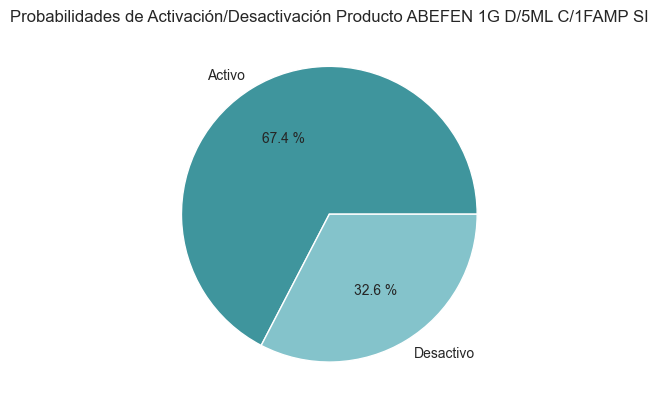

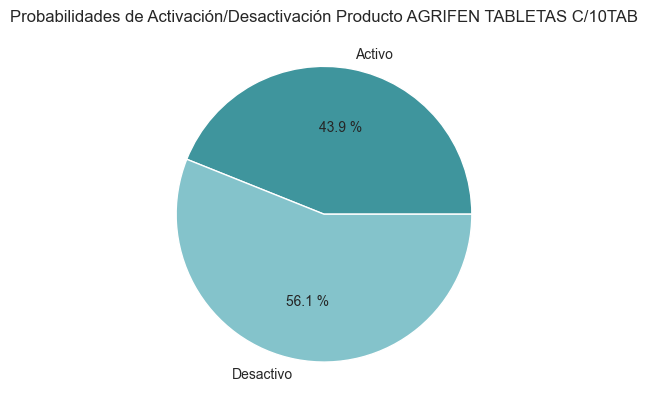

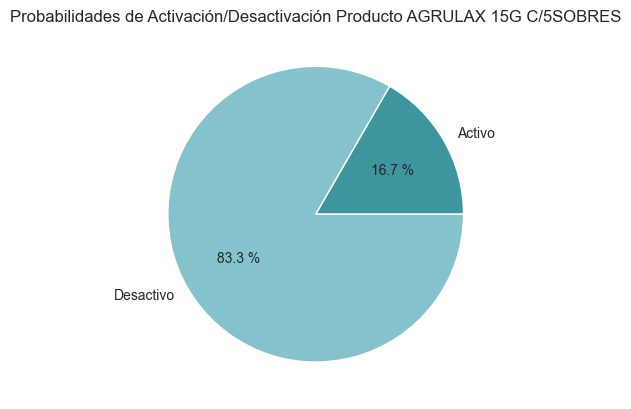

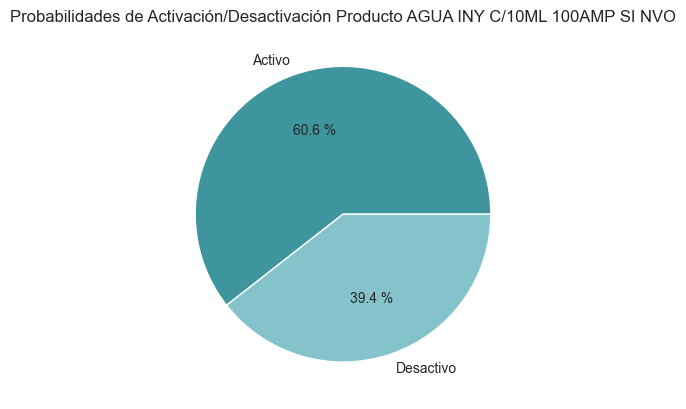

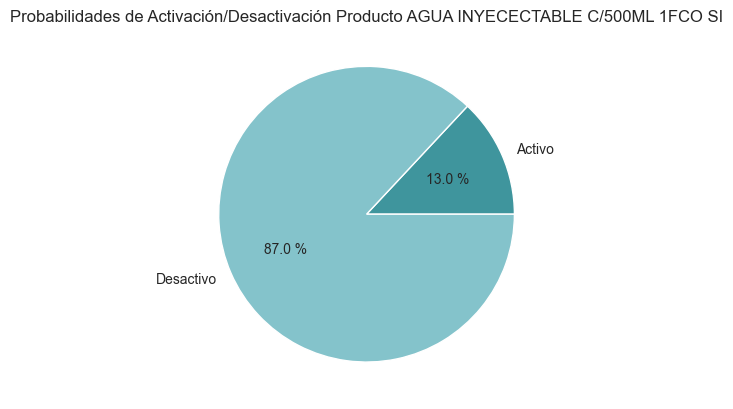

In [60]:
# Gráficos para comparar probabilidades estacionarias de los estados
for i in Claudio[:5]:
    id=i[1]
    proba=i[0]

    estados=['Activo', 'Desactivo']
    plt.pie(proba, labels=estados, autopct="%0.1f %%", colors=['#3f959d','#84c3cb'])
    plt.title(f'Probabilidades de Activación/Desactivación Producto {id}')
    plt.axis()
    plt.show()

## Convergencia de las probabilidades Material

In [61]:
# Elegir productos al azar para graficar su convergencia
k=list(dict_matriz_transiciones.keys())

key=np.random.choice(k, size=3)
key

array(['PORT-A-CATH VEN 8.4FR B PERF INTR 9FR',
       'LINICETIL 50MG LIOF C/1FAMP SI', 'INFUSOR 100ML 2ML/H HOMEPUMP C'],
      dtype='<U40')

In [62]:
pi_0=np.array([0.3, 0.7])
for d in key:
    proba_activo=[]
    proba_desactivo=[]

    contador=0
    for i in range(len(n)):
        matriz_n=np.round(np.linalg.matrix_power(dict_matriz_transiciones[d],n[i]), 10)
        pi_n=np.linalg.matmul(pi_0,matriz_n)

        proba_activo.append(pi_n[0])
        proba_desactivo.append(pi_n[1])


        if np.all(matriz_n[0]==matriz_n[1]):
            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

            # Probabilidad de activación
            ax1.plot(n[:i+1], proba_activo, label='Probabilidad de activación', color='green')
            ax1.set_title(f'Convergencia de Activación para Material {d}')
            ax1.set_xlabel('Iteraciones')
            ax1.set_ylabel('Probabilidades')
            ax1.legend()
            
            texto_info1 = f'Prob. estacionaria: {pi_n[0]:.3f}'
            ax1.text(0.95, 0.5, texto_info1, transform=ax1.transAxes,
                     fontsize=10, verticalalignment='top', horizontalalignment='right',
                     bbox=dict(boxstyle='round,pad=0.3', edgecolor='black', facecolor='lightgray'))

            # Probabilidad de desactivación
            ax2.plot(n[:i+1], proba_desactivo, label='Probabilidad de desactivación', color='red')
            ax2.set_title(f'Convergencia de Desactivación para Material {d}')
            ax2.set_xlabel('Iteraciones')
            ax2.set_ylabel('Probabilidades')
            ax2.legend()

            texto_info2 = f'Prob. estacionaria: {pi_n[1]:.3f}'
            ax2.text(0.95, 0.5, texto_info2, transform=ax2.transAxes,
                     fontsize=10, verticalalignment='top', horizontalalignment='right',
                     bbox=dict(boxstyle='round,pad=0.3', edgecolor='black', facecolor='lightgray'))

            plt.tight_layout()
            plt.show()
            
            break
            
        contador+=1
        
    if contador<=(len(n)):
        print(f'El vector de probabilidades pi({d})={matriz_n[0]}, con limite n={n[i]}')
    else:
        print('La matriz no converge')

AttributeError: module 'numpy.linalg' has no attribute 'matmul'

## Gráficos de distribución de las probabilidades Materiales 

In [63]:
Claudio_pd = pd.DataFrame(Claudio, columns=['Prob Est ([A, D])', 'id_material'])
Claudio_pd

,"Prob Est ([A, D])",id_material
0,"[0.6737967914, 0.3262032086]",ABEFEN 1G D/5ML C/1FAMP SI
1,"[0.4393939394, 0.5606060606]",AGRIFEN TABLETAS C/10TAB
2,"[0.1666666667, 0.8333333333]",AGRULAX 15G C/5SOBRES
3,"[0.6056338028, 0.3943661972]",AGUA INY C/10ML 100AMP SI NVO
4,"[0.1304347826, 0.8695652174]",AGUA INYECECTABLE C/500ML 1FCO SI
...,...,...
589,"[0.375, 0.625]",VITAFUSIN-PED C/1FAMP D/5ML SI PED
590,"[0.2857142857, 0.7142857143]",XERENDIP 16UI D/1ML C/CART LIOF SI NVAIM
591,"[0.1226993865, 0.8773006135]",XERENDIP 4UI D/1ML C/1FAMP SI
592,"[0.2732240437, 0.7267759563]",ZN-FUSIN 1MG/ML C/10ML 5FAMP SI


In [64]:
len(dict_matriz_transiciones)

594

In [65]:
graph_data

[[0.6737967914, 'A'],
 [0.3262032086, 'D'],
 [0.4393939394, 'A'],
 [0.5606060606, 'D'],
 [0.1666666667, 'A'],
 [0.8333333333, 'D'],
 [0.6056338028, 'A'],
 [0.3943661972, 'D'],
 [0.1304347826, 'A'],
 [0.8695652174, 'D'],
 [0.5319148936, 'A'],
 [0.4680851064, 'D'],
 [0.9893048128, 'A'],
 [0.0106951872, 'D'],
 [0.1428571429, 'A'],
 [0.8571428571, 'D'],
 [0.2880434783, 'A'],
 [0.7119565217, 'D'],
 [0.6363636364, 'A'],
 [0.3636363636, 'D'],
 [0.9382022472, 'A'],
 [0.0617977528, 'D'],
 [0.3459459459, 'A'],
 [0.6540540541, 'D'],
 [0.9625668449, 'A'],
 [0.0374331551, 'D'],
 [0.1785714286, 'A'],
 [0.8214285714, 'D'],
 [0.1428571429, 'A'],
 [0.8571428571, 'D'],
 [0.9839572193, 'A'],
 [0.0160427807, 'D'],
 [0.9679144385, 'A'],
 [0.0320855615, 'D'],
 [1.0, 'A'],
 [0.0, 'D'],
 [0.9946524064, 'A'],
 [0.0053475936, 'D'],
 [0.9946524064, 'A'],
 [0.0053475936, 'D'],
 [0.1101694915, 'A'],
 [0.8898305085, 'D'],
 [0.0714285714, 'A'],
 [0.9285714286, 'D'],
 [0.5621621622, 'A'],
 [0.4378378378, 'D'],
 [0.30

In [66]:
graph_data_1 = pd.DataFrame(graph_data, columns=['Prob', 'Estado'])

In [67]:
graph_data_1

,Prob,Estado
0,0.673797,A
1,0.326203,D
2,0.439394,A
3,0.560606,D
4,0.166667,A
...,...,...
1183,0.877301,D
1184,0.273224,A
1185,0.726776,D
1186,0.088235,A


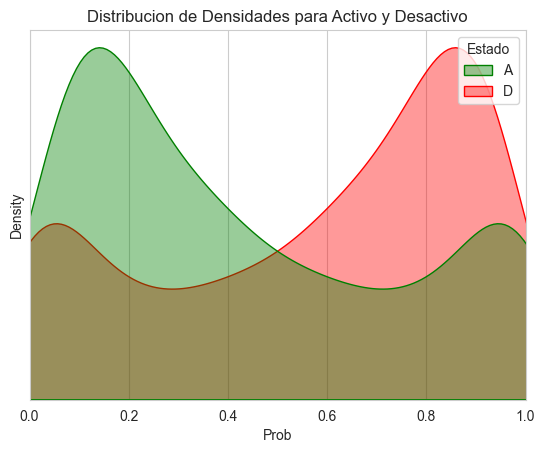

In [68]:
# With transparency
colors = ['g','r']
sns.kdeplot(data=graph_data_1, x="Prob", hue="Estado", fill=True, common_norm=False, alpha=0.4, palette=colors)
plt.xlim(0, 1)
plt.title("Distribucion de Densidades para Activo y Desactivo")
plt.yticks([])
plt.show()

/var/folders/6k/ggtrwjgn11ng2t9mrds12n_m0000gn/T/ipykernel_93206/3096835485.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(y="Estado", x="Prob", data=graph_data_1, fill=False, palette=colors, width=1, linewidth=1)


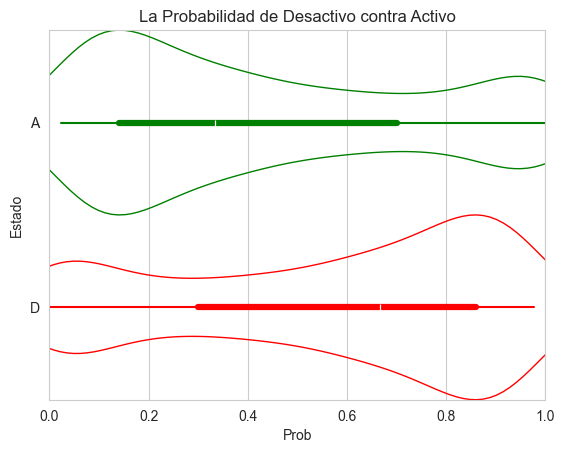

In [69]:
sns.set_style('whitegrid')
sns.violinplot(y="Estado", x="Prob", data=graph_data_1, fill=False, palette=colors, width=1, linewidth=1)
plt.title("La Probabilidad de Desactivo contra Activo")
plt.xlim(0, 1)
plt.show()

In [70]:
# Numero de prob. Estacionarias donde A > 0.50

filtered_df_A = graph_data_1[graph_data_1['Estado']=="A"]

Q_A_025 = filtered_df_A.query('Prob < 0.25').shape[0]
Q_A_050 = filtered_df_A.query('Prob < 0.5').shape[0]
Q_A_075 = filtered_df_A.query('Prob < 0.75').shape[0]
Q_A_100 = filtered_df_A.query('Prob < 1').shape[0]


print(f'Quantiles 0 - 25 % de Datos de A = {Q_A_025:.0f}\n'
      f'Quantiles 25 - 50 % de Datos de A = {Q_A_050 - Q_A_025:.0f}\n'
      f'Quantiles 50 - 75 % de Datos de A = {Q_A_075 - Q_A_050:.0f}\n'
      f'Quantiles 75 - 100 % de Datos de A = {Q_A_100 - Q_A_075:.0f}\n')

Quantiles 0 - 25 % de Datos de A = 245
Quantiles 25 - 50 % de Datos de A = 135
Quantiles 50 - 75 % de Datos de A = 75
Quantiles 75 - 100 % de Datos de A = 114



In [71]:
# Numero de prob. Estacionarias donde D > 0.50

filtered_df_D = graph_data_1[graph_data_1['Estado']=="D"]

Q_D_025 = filtered_df_D.query('Prob < 0.25').shape[0]
Q_D_050 = filtered_df_D.query('Prob < 0.5').shape[0]
Q_D_075 = filtered_df_D.query('Prob < 0.75').shape[0]
Q_D_100 = filtered_df_D.query('Prob < 1').shape[0]

print(f'Quantiles 0 - 25 % de Datos de D = {Q_D_025:.0f}\n'
      f'Quantiles 25 - 50 % de Datos de D = {Q_D_050 - Q_D_025:.0f}\n'
      f'Quantiles 50 - 75 % de Datos de D = {Q_D_075 - Q_D_050:.0f}\n'
      f'Quantiles 75 - 100 % de Datos de D = {Q_D_100 - Q_D_075:.0f}\n')



Quantiles 0 - 25 % de Datos de D = 139
Quantiles 25 - 50 % de Datos de D = 73
Quantiles 50 - 75 % de Datos de D = 135
Quantiles 75 - 100 % de Datos de D = 247



In [72]:
plot_data = [[Q_D_025, Q_A_025],
             [Q_D_050 - Q_D_025, Q_A_050 - Q_A_025],
             [Q_D_075 - Q_D_050, Q_A_075 - Q_A_050],
             [Q_D_100 - Q_D_075, Q_A_100 - Q_A_075]]

plot_data_1 = pd.DataFrame(plot_data, columns=['D', 'A'])
plot_data_1

,D,A
0,139,245
1,73,135
2,135,75
3,247,114
